In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# LEVEL :- 1
## TASK :- 1

# DATA UNDERSTANDING

In [2]:
df = pd.read_csv("Dataset .csv")
df.head().T

,0,1,2,3,4
Restaurant ID,6317637,6304287,6300002,6318506,6314302
Restaurant Name,Le Petit Souffle,Izakaya Kikufuji,Heat - Edsa Shangri-La,Ooma,Sambo Kojin
Country Code,162,162,162,162,162
City,Makati City,Makati City,Mandaluyong City,Mandaluyong City,Mandaluyong City
Address,"Third Floor, Century City Mall, Kalayaan Avenu...","Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Third Floor, Mega Fashion Hall, SM Megamall, O...","Third Floor, Mega Atrium, SM Megamall, Ortigas..."
Locality,"Century City Mall, Poblacion, Makati City","Little Tokyo, Legaspi Village, Makati City","Edsa Shangri-La, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City"
Locality Verbose,"Century City Mall, Poblacion, Makati City, Mak...","Little Tokyo, Legaspi Village, Makati City, Ma...","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...","SM Megamall, Ortigas, Mandaluyong City, Mandal...","SM Megamall, Ortigas, Mandaluyong City, Mandal..."
Longitude,121.027535,121.014101,121.056831,121.056475,121.057508
Latitude,14.565443,14.553708,14.581404,14.585318,14.58445
Cuisines,"French, Japanese, Desserts",Japanese,"Seafood, Asian, Filipino, Indian","Japanese, Sushi","Japanese, Korean"


1. **`Restaurant ID`** : A unique identifier assigned to each restaurant's.
2. **`Restaurant Name`** : The name of the restaurant.
3. **`Country Code`** : A numeric code representing the country in which the restaurant is located.
4. **`City`** : The city where the restaurant is located.
5. **`Address`** : The complete address of the restaurant.
6. **`Locality`** : A more specific area or neighborhood within the city where the restaurant is located.
7. **`Locality Verbose`** : A detailed description of the locality or area.
8. **`Longitude`** : The longitude coordinate of the restaurant's location.
9. **`Latitude`** : The latitude coordinate of the restaurant's location.
10. **`Cuisines`** : The type(s) of cuisine offered by the restaurant.
11. **`Average Cost for Two`** : The average cost for two people dining at the restaurant.
12. **`Currency`** : The currency used for pricing in the restaurant's country.
13. **`Has Table Booking`** : Indicates whether the restaurant offers table booking.
14. **`Has Online Delivery`** : Indicates whether the restaurant provides online food delivery.
15. **`Is Delivering Now`**  : Indicates whether the restaurant is currently delivering.
16. **`Switch to Order Menu`** : Indicates if the restaurant has a menu dedicated to online orders.
17. **`Price Range`** : A categorical representation of the restaurant's price range.
18. **`Aggregate Rating`** : The overall rating of the restaurant, aggregated from customer reviews.
19. **`Rating Color`** : A color code associated with the restaurant's aggregate rating.
20. **`Rating Text`** : A text-based descriptor of the restaurant's rating (e.g., "Excellent", "Good").
21. **`Votes`** : The number of votes or reviews received by the restaurant.

# DATA EXPLORATION

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [4]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

**The `cuisines` column has 9 missing values.**

In [5]:
df.duplicated().sum()

0

## Converting Columns into different types of data categories for easy analysis:
1. **Nominal-Categorical (Non-Ordered Categories)** : These are categorical variables with no intrinsic ordering.
2. **Ordinal-Categorical (Ordered Categories)** : These are categorical variables with a meaningful order or hierarchy.
3. **Discrete-Numerical (Countable Integers)** : These are numeric variables that represent counts or have discrete values.
4. **Continuous-Numerical (Measured and can take any value)** : These are numeric variables that represent measurements and can take on a wide range of values.
---
- **Nominal_Categorical** : `Restaurant Name`,`Country Code`,`City`,`Address`,`Locality`, `Locality Verbose`,`Cuisines`,`Currency`,`Has Table booking`, `Has Online delivery`,`Is delivering now`,`Switch to order menu`.
- **Ordinal_Categorical** : `Rating color`,`Rating text`,`Price range`.
- **Discrete_Numerical** : `Restaurant ID`,`Votes`.
- **Continuous_Numerical** : `Longitude`,`Latitude`,`Aggregate rating`,`Average Cost for two`.

In [6]:
df['Restaurant ID'].nunique()

9551

In [7]:
df['Restaurant Name'].nunique()

7446

**Out of 9551 Restaurants Name in dataset there are only 7446 unique value i.e., In this 7442 Restaurant some restaurants may have franchise or may not either in same country different cities or in different countries**

In [8]:
franchise_counts = df['Restaurant Name'].value_counts()
franchises = franchise_counts[franchise_counts > 1]
num_franchises = franchises.shape[0]
print(f"Number of restaurants with franchises: {num_franchises}")

Number of restaurants with franchises: 734


**There are 734 Restaurants having franchise may or may not be either in same country in different cities or in different countries**

In [9]:
df[['Is delivering now','Switch to order menu']].nunique()

Is delivering now       2
Switch to order menu    1
dtype: int64

Switch to order menu
No    9551
Name: count, dtype: int64
Is delivering now
No     9517
Yes      34
Name: count, dtype: int64 



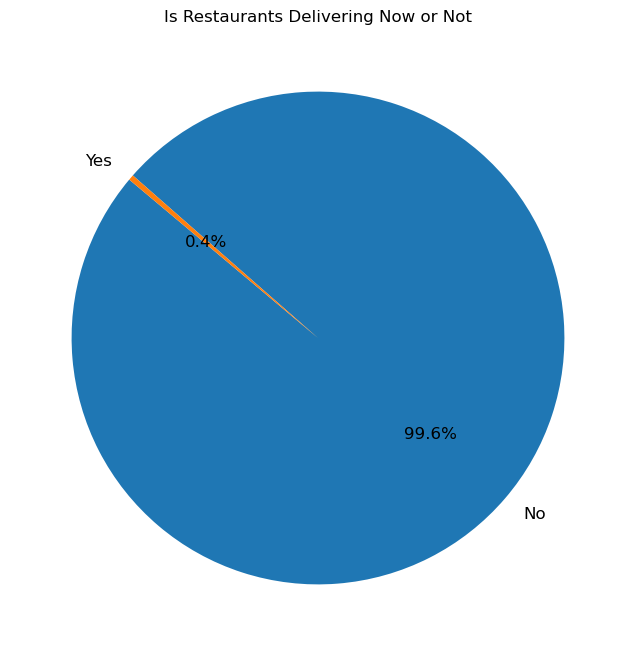

In [10]:
print(df['Switch to order menu'].value_counts())
print(df['Is delivering now'].value_counts(),"\n")
colors = ['#1f77b4', '#ff7f0e']
plt.figure(figsize=(8, 8))
plt.pie(
    df['Is delivering now'].value_counts(), 
    labels=df['Is delivering now'].value_counts().index, 
    autopct='%1.1f%%', 
    colors=colors, 
    startangle=140, 
    textprops={'fontsize': 12, 'color': 'black'}
)
plt.title("Is Restaurants Delivering Now or Not")
plt.show()

1. **Switch to Order Menu :**
   - All 9551 restaurants in the dataset have not switched to an order menu, indicating that these restaurants are not offering specialized or separate menus for online ordering.
2. **Is Delivering Now :**
   - Only 34 restaurants (less than 1%) are marked as currently delivering food, while 9517 are not delivering at the moment.
   - This may imply that most restaurants in the dataset are not operating 24/7 or have limited delivery windows.
---
##### **Inferences :**
1. **Switch to Order Menu :**
   - Since no restaurants have a separate order menu, it suggests that:
     - Restaurants may be using the same menu for both dine-in and online orders.
     - There may be room for improvement in curating specialized menus for delivery to optimize operational efficiency and enhance the customer experience.
2. **Delivering Now :**
   - The extremely low count of restaurants delivering at the moment indicates that either:
     - The data was collected outside peak hours, explaining the inactive delivery status.
     - Most restaurants operate with fixed delivery hours and are not always available for delivery.
---
##### **Actionable Insights :**
1. **For Switching to Order Menu :**
   - Restaurants could create a dedicated delivery menu with optimized options (fewer dishes, delivery-friendly packaging) to streamline operations and reduce complexity for both the staff and customers.
2. **For "Delivering Now" :**
   - Restaurants with online delivery options could consider extending their delivery hours or offering 24/7 services in high-demand areas to cater to late-night or off-peak orders.
   - Highlighting restaurants that are delivering "right now" during peak times could improve visibility and customer engagement.

In [11]:
df.groupby('Rating text')['Rating color'].unique()

Rating text
Average          [Orange]
Excellent    [Dark Green]
Good             [Yellow]
Not rated         [White]
Poor                [Red]
Very Good         [Green]
Name: Rating color, dtype: object

There are 6 categories of Colours Ratings.
 They are : 
['Dark Green' 'Green' 'Yellow' 'Orange' 'White' 'Red'] 



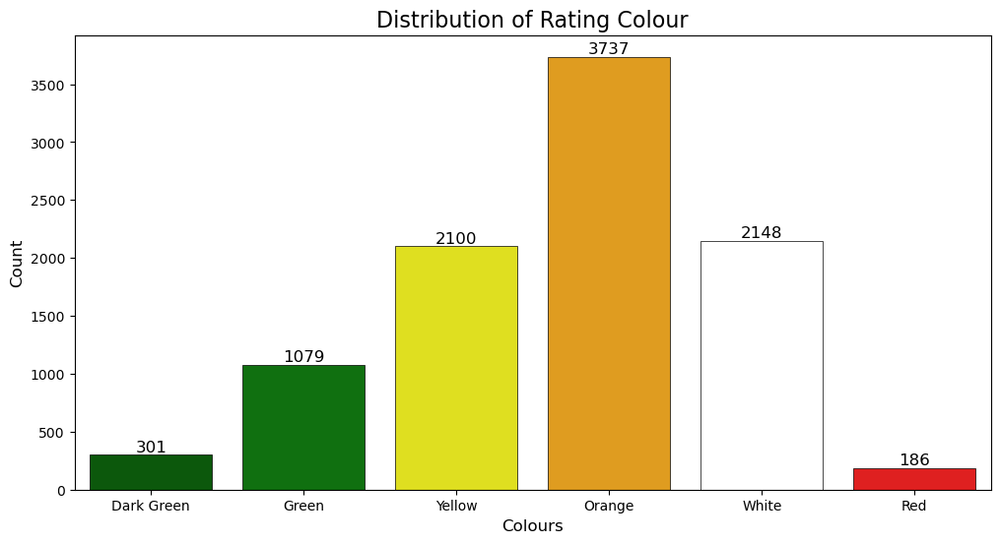

In [12]:
print(f"There are {df['Rating color'].nunique()} categories of Colours Ratings.\n They are : ")
print(df['Rating color'].unique(),"\n")
custom_palette = {
    'Dark Green': '#006400',
    'Green': '#008000',       
    'Yellow': '#FFFF00',      
    'Orange': '#FFA500',      
    'White': '#FFFFFF',       
    'Red': '#FF0000'          
}
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=df, x='Rating color', palette=custom_palette)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(f'{count}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),  # Position
                ha='center', va='bottom', fontsize=12, color='black')  # Styling
    p.set_edgecolor('black')
    p.set_linewidth(0.5)  
plt.title('Distribution of Rating Colour', fontsize=16)
plt.xlabel('Colours', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

There are 6 categories of Text Ratings.
 They are : 
['Excellent' 'Very Good' 'Good' 'Average' 'Not rated' 'Poor'] 



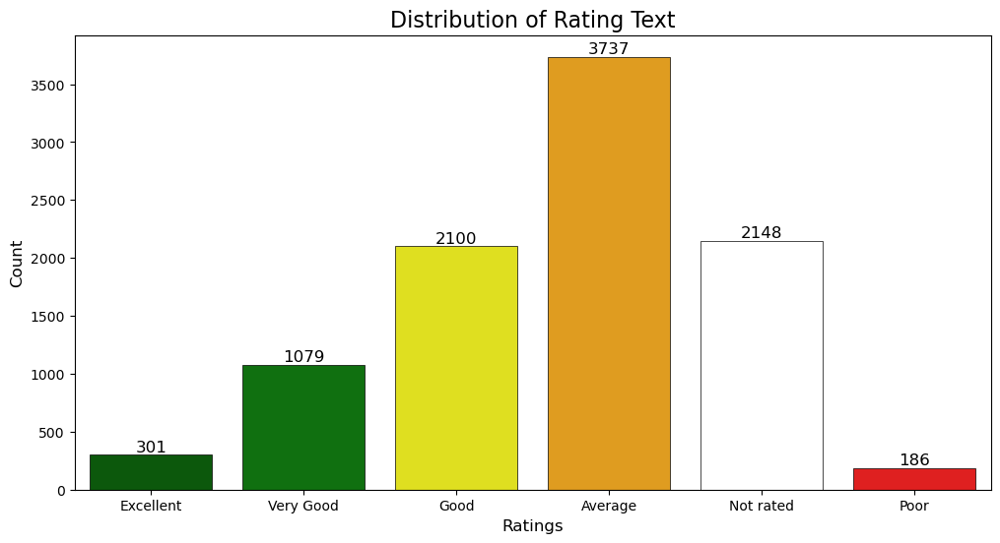

In [13]:
print(f"There are {df['Rating text'].nunique()} categories of Text Ratings.\n They are : ")
print(df['Rating text'].unique(),"\n")
custom_palette = {
    'Excellent': '#006400',
    'Very Good': '#008000',       
    'Good': '#FFFF00',      
    'Average': '#FFA500',      
    'Not rated': '#FFFFFF',       
    'Poor': '#FF0000'          
}
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=df, x='Rating text', palette=custom_palette)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(f'{count}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),  # Position
                ha='center', va='bottom', fontsize=12, color='black')  # Styling
    p.set_edgecolor('black')
    p.set_linewidth(0.5)  
plt.title('Distribution of Rating Text', fontsize=16)
plt.xlabel('Ratings', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

1. **Customer Satisfaction**:
   - The high count of "Average" and "Not rated" ratings could suggest a lack of strong satisfaction among customers, or perhaps an issue with how customers are incentivized to leave ratings.
   - The scarcity of Excellent and Poor ratings may imply that customers are more inclined to leave neutral or average feedback rather than extreme ratings.
2. **Restaurant Quality Perception**:
   - The fact that Green and Dark Green (representing "Very Good" and "Excellent") are much less frequent could indicate that only a small portion of restaurants are perceived as exceptional by customers.
   - Red (Poor) ratings are very low, which may either reflect a lack of truly poor-performing restaurants or a reluctance to leave negative reviews.
3. **Improvement Areas**:
   - The large proportion of Average and Not rated categories could be an opportunity for the restaurant owners to focus on improving customer satisfaction or incentivizing reviews.
4. **Market Trends**:
   - The frequency distribution of ratings (with many mid-range ratings and fewer extreme ratings) could suggest a trend where customers generally avoid giving extreme ratings, which is a common phenomenon in review-based systems.

**Suggestions**:
- Focus on improving customer experience to increase the proportion of "Very Good" and "Excellent" ratings.
- Increase engagement by encouraging customers to leave ratings, especially for restaurants with Not rated statuses.
- Investigate restaurants with "Poor" ratings to understand and address the underlying issues leading to negative customer feedback.

There are 4 categories of Price Range.
 They are : 
[3 4 2 1] 



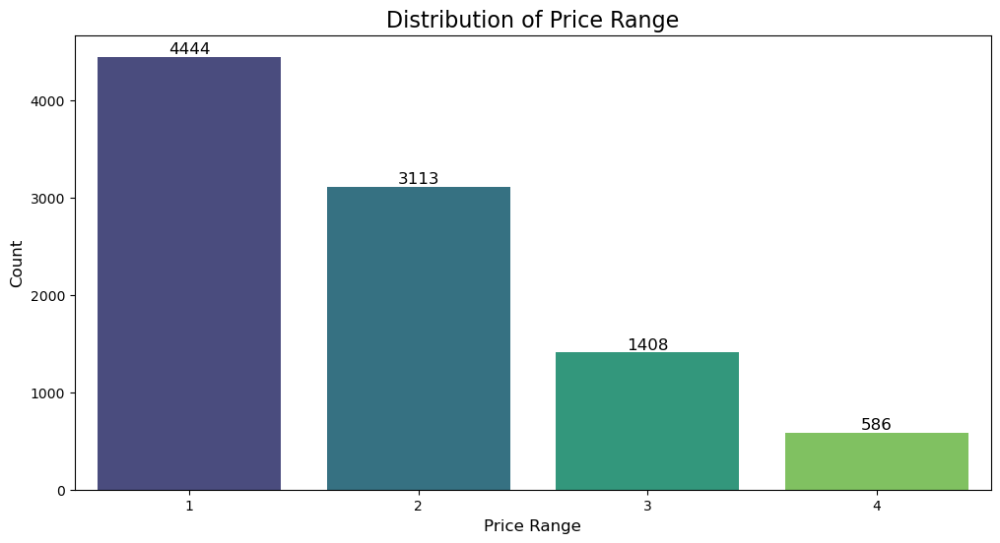

In [14]:
print(f"There are {df['Price range'].nunique()} categories of Price Range.\n They are : ")
print(df['Price range'].unique(),"\n")
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=df, x='Price range', palette='viridis')
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(f'{count}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),  # Position
                ha='center', va='bottom', fontsize=12, color='black')  # Styling 
plt.title('Distribution of Price Range', fontsize=16)
plt.xlabel('Price Range', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.show()

##### **1. Price Range Categories:**
- The dataset categorizes restaurants into four price ranges, presumably based on the cost of dining:
  - 1 (Lowest Price Range): 4444 restaurants (~47% of the total).
  - 2 (Affordable Price Range): 3113 restaurants (~33% of the total).
  - 3 (Moderate Price Range): 1408 restaurants (~15% of the total).
  - 4 (High Price Range): 586 restaurants (~6% of the total).
##### **2. Dominance of Lower Price Ranges:**
- A significant majority of restaurants (4444 + 3113 = 7557 restaurants, ~80%) fall into the lowest two price categories (1 and 2).
- Only 1994 restaurants (~20%) fall into the higher price categories (3 and 4).
---
##### **Inferences :**
1. **Affordability Drives the Market :**
   - The data suggests that most restaurants in this dataset cater to a customer base that prioritizes affordability, as almost half of them are in the lowest price range.
   - This trend might reflect a higher demand for casual dining or fast-food establishments over fine dining.
2. **Limited High-End Options :**
   - Restaurants in the highest price range (category 4) account for only 6% of the total. This indicates that high-end or premium dining options are limited in the dataset.
   - It could also imply that higher price ranges are niche markets catering to specific customer segments.
3. **Opportunity for Mid-Range Pricing :**
   - The moderate price range (category 3) also has fewer restaurants (15%). This suggests that there may be a market opportunity to expand offerings in this segment, appealing to customers looking for quality dining experiences without premium pricing.
4. **Market Segmentation Insights :**
   - Regions with a higher concentration of price range 1 and 2 restaurants might target students, office workers, or budget-conscious families.
   - Regions with price ranges 3 and 4 might cater to higher-income groups, tourists, or fine-dining enthusiasts.
---
##### **Actionable Insights :**
1. **For Restaurant Owners :**
   - If targeting a broader audience, new restaurants could focus on affordable pricing (categories 1 and 2) to match the majority's preference.
   - Alternatively, they could explore premium dining (categories 3 and 4) in locations with a high-income customer base where competition is limited.
2. **For Delivery Services :**
   - The dominance of lower price ranges suggests that online food delivery platforms should prioritize affordable options in their recommendations, as these are likely the most popular.
3. **For Policy Makers or Investors :**
   - Investments in high-end dining may be profitable in niche markets, but significant returns could be expected from casual and affordable dining due to the larger customer base.

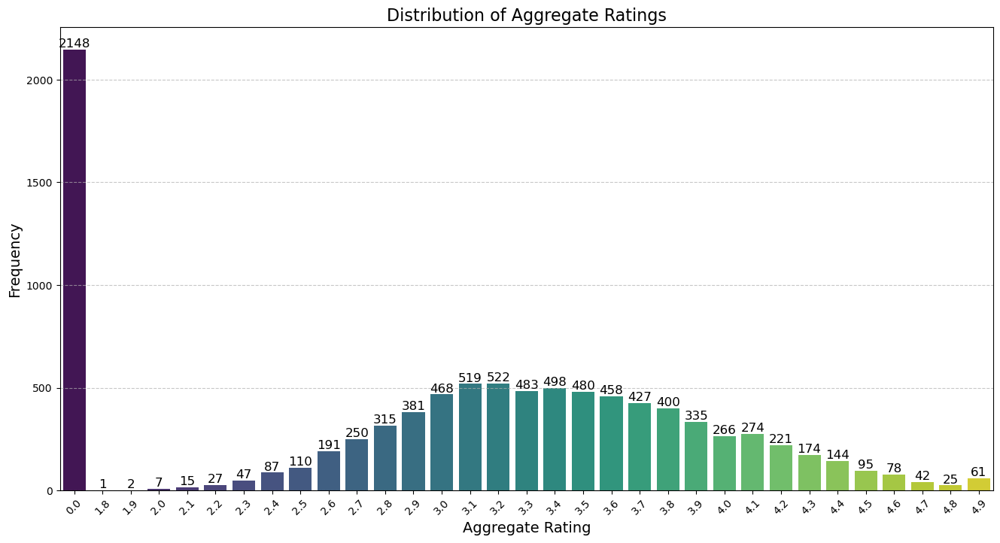

In [15]:
rating_distribution = df['Aggregate rating'].value_counts().sort_index()
plt.figure(figsize=(16, 8))
ax = sns.barplot(
    x=rating_distribution.index,
    y=rating_distribution.values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Distribution of Aggregate Ratings", fontsize=16)
plt.xlabel("Aggregate Rating", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Ratings of 0.0 are significantly more frequent, indicating a potential class imbalance. Mid-range ratings (2.5–4.0) are well-distributed, while higher ratings (4.8–4.9) are relatively rare.
##### **1. High Frequency of "Not Rated" Restaurants (Rating = 0.0)**
- **Count:** 2,148 restaurants are marked as "0.0" aggregate rating, which likely indicates these restaurants have not been rated yet or do not have sufficient customer feedback.
- **Implication:**
  - A significant portion of the restaurant lacks customer ratings, suggesting that these many restaurants may be newly added or have low customer engagement.
  - These restaurants might require more marketing efforts to attract customers and collect feedback.
---
##### **2. Majority of Ratings Cluster Around the Mid-Range (3.0–3.9)**
- **Observation:** Most ratings are between **3.0 and 3.9**, indicating that the majority of restaurants are perceived as average or slightly above average in quality.
- **Examples:**
  - 3.2: 522 restaurants.
  - 3.5: 480 restaurants.
  - 3.9: 335 restaurants.
- **Implication:**
  - The quality and services offered by these restaurants are generally acceptable but may lack factors to make them stand out as exceptional.
  - Restaurants in this range could focus on improvements in customer experience, food quality, or pricing to enhance ratings.
---
##### **3. Fewer Restaurants Have Ratings Above 4.0**
- **Observation:** Restaurants rated **4.0 and above** are relatively fewer, with the highest counts being:
  - 4.1: 274 restaurants.
  - 4.2: 221 restaurants.
  - 4.5: 95 restaurants.
  - Only 25 restaurants have an exceptional rating of **4.8**, and 61 restaurants have the maximum rating of **4.9**.
- **Implication:**
  - These restaurants are likely recognized for outstanding quality, service, or unique offerings.
  - They may serve as benchmarks for other restaurants aiming to improve their reputation.
---
##### **4. Low Ratings Below 2.5 Are Rare**
- **Observation:** Only a small number of restaurants have ratings below **2.5**, such as:
  - 2.5: 110 restaurants.
  - 2.0: 7 restaurants.
  - 1.8: 1 restaurant.
- **Implication:**
  - Restaurants in this range likely face issues such as poor service, low food quality, or bad customer experiences.
  - Immediate corrective measures and feedback collection are necessary to improve their performance and attract customers.
---
##### **5. Customer Perception Trends**
- **Observation:** Customers tend to rate most restaurants in the **average range (3.0–3.9)**, while extreme ratings (either very high or very low) are less common.
- **Implication:**
  - This could indicate a bias toward middle-ground ratings, where customers are less likely to give extreme ratings unless they have a strongly positive or negative experience.
---
##### **6. Business Insights and Recommendations**
- **For unrated restaurants (Rating = 0.0):** 
  - Encourage customers to leave reviews through incentives like discounts, loyalty programs, or online promotions.
- **For average-rated restaurants (3.0–3.9):**
  - Focus on areas like menu diversification, ambiance, and customer service to improve ratings.
- **For highly rated restaurants (4.0+):**
  - Capitalize on their reputation by promoting themselves as premium or top-tier restaurants to attract more customers.
- **For poorly rated restaurants (<2.5):**
  - Management should immediately address customer complaints, improve quality standards, and rebuild their reputation.

In [16]:
top_10_restaurants = df.nlargest(10, 'Aggregate rating')
top_10_restaurants = top_10_restaurants.sort_values(by='Votes', ascending=False).reset_index(drop=True)
print("Top 10 Restaurants by Aggregate Rating")
top_10_restaurants.T

Top 10 Restaurants by Aggregate Rating


,0,1,2,3,4,5,6,7,8,9
Restaurant ID,6309903,17316744,6300010,17294607,17335156,6318506,17334212,7300515,7300955,6600427
Restaurant Name,Silantro Fil-Mex,Shorts Burger and Shine,Spiral - Sofitel Philippine Plaza Manila,Rae's Coastal Cafe,Tantra Asian Bistro,Ooma,Oakwood Cafe,Garota de Ipanema,Braseiro da G��vea,Coco Bambu
Country Code,162,216,162,216,216,162,216,30,30,30
City,Pasig City,Cedar Rapids/Iowa City,Pasay City,Augusta,Davenport,Mandaluyong City,Dalton,Rio de Janeiro,Rio de Janeiro,Bras�_lia
Address,"75 East Capitol Drive, Kapitolyo, Pasig City","18 S Clinton St, Iowa City, IA 52240","Plaza Level, Sofitel Philippine Plaza Manila, ...","3208 W Wimbledon Dr, Augusta, GA 30909","589 East 53rd St, Davenport, IA 52807","Third Floor, Mega Fashion Hall, SM Megamall, O...","201 West Cuyler Street, Dalton, GA 30720","Rua Vinicius de Moraes, 49, Ipanema, Rio de Ja...","Pra�_a Santos Dumont, 116, G��vea, Rio de Janeiro","SCES, Trecho 2, Conjunto 13/36, Setor de Clube..."
Locality,Kapitolyo,Iowa City,"Sofitel Philippine Plaza Manila, Pasay City",Augusta,Davenport,"SM Megamall, Ortigas, Mandaluyong City",Dalton,Ipanema,G��vea,Setor De Clubes Esportivos Sul
Locality Verbose,"Kapitolyo, Pasig City","Iowa City, Cedar Rapids/Iowa City","Sofitel Philippine Plaza Manila, Pasay City, P...","Augusta, Augusta","Davenport, Davenport","SM Megamall, Ortigas, Mandaluyong City, Mandal...","Dalton, Dalton","Ipanema, Rio de Janeiro","G��vea, Rio de Janeiro","Setor De Clubes Esportivos Sul, Bras�_lia"
Longitude,121.057916,-91.534424,120.98009,-82.0698,-90.565837,121.056475,-84.969393,-43.203,-43.227042,-47.8685
Latitude,14.567689,41.660982,14.55299,33.4791,41.574459,14.585318,34.769686,-22.985333,-22.973507,-15.819
Cuisines,"Filipino, Mexican",Burger,"European, Asian, Indian","American, Caribbean, Seafood",Asian,"Japanese, Sushi","BBQ, Breakfast, Southern","Brazilian, Bar Food","Brazilian, Bar Food",International


In [17]:
df.groupby("Rating color")["Aggregate rating"].agg([min, max]).reset_index()

,Rating color,min,max
0,Dark Green,4.5,4.9
1,Green,4.0,4.4
2,Orange,2.5,3.4
3,Red,1.8,2.4
4,White,0.0,0.0
5,Yellow,3.5,3.9


In [18]:
df.groupby("Rating text")["Aggregate rating"].agg([min, max]).reset_index()

,Rating text,min,max
0,Average,2.5,3.4
1,Excellent,4.5,4.9
2,Good,3.5,3.9
3,Not rated,0.0,0.0
4,Poor,1.8,2.4
5,Very Good,4.0,4.4


# Handling Missing Value in `Cuisines` column

In [19]:
df[df.isnull().any(axis=1)]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
84,17284105,Cookie Shoppe,216,Albany,"115 N Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.154000,31.577200,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,34
87,17284211,Pearly's Famous Country Cookng,216,Albany,"814 N Slappey Blvd, Albany, GA 31701",Albany,"Albany, Albany",-84.175900,31.588200,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,36
94,17284158,Jimmie's Hot Dogs,216,Albany,"204 S Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.153400,31.575100,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,160
297,17374552,Corkscrew Cafe,216,Gainesville,"51 W Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.985800,34.531800,NaN,...,Dollar($),No,No,No,No,3,3.9,Yellow,Good,209
328,17501439,Dovetail,216,Macon,"543 Cherry St, Macon, GA 31201",Macon,"Macon, Macon",-83.627979,32.836410,NaN,...,Dollar($),No,No,No,No,3,3.8,Yellow,Good,102
346,17606621,HI Lite Bar & Lounge,216,Miller,"109 N Broadway Ave, Miller, SD 57362",Miller,"Miller, Miller",-98.989100,44.515800,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,11
368,17059060,Hillstone,216,Orlando,"215 South Orlando Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.365260,28.596682,NaN,...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1158
418,17142698,Leonard's Bakery,216,Rest of Hawaii,"933 Kapahulu Ave, Honolulu, HI 96816",Kaimuki,"Kaimuki, Rest of Hawaii",-157.813432,21.284586,NaN,...,Dollar($),No,No,No,No,1,4.7,Dark Green,Excellent,707
455,17616465,Tybee Island Social Club,216,Savannah,"1311 Butler Ave, Tybee Island, GA 31328",Tybee Island,"Tybee Island, Savannah",-80.848297,31.995810,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,309


### From the above observation first let see if the Restaurant having missing in `Cuisines` column has any Franchise in any another city then we can import the same cuisines in the missing value. If there is no Frachise of that restaurant then we can import the missing value by neraby locality of same city with the help of target column i.e., `Aggregate rating` columns means Restaurants having same aggregate rating can be imported with the same cuisines as a assumptions else we will drop that row.

In [20]:
df[df['Restaurant Name'] == 'Cookie Shoppe']

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
84,17284105,Cookie Shoppe,216,Albany,"115 N Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.154,31.5772,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,34


In [21]:
df[df['Restaurant Name'] == "Pearly's Famous Country Cookng"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
87,17284211,Pearly's Famous Country Cookng,216,Albany,"814 N Slappey Blvd, Albany, GA 31701",Albany,"Albany, Albany",-84.1759,31.5882,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,36


In [22]:
df[df['Restaurant Name'] == "Jimmie's Hot Dogs"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
94,17284158,Jimmie's Hot Dogs,216,Albany,"204 S Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.1534,31.5751,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,160


In [23]:
df[df['Restaurant Name'] == "Corkscrew Cafe"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
297,17374552,Corkscrew Cafe,216,Gainesville,"51 W Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.9858,34.5318,NaN,...,Dollar($),No,No,No,No,3,3.9,Yellow,Good,209


In [24]:
df[df['Restaurant Name'] == "Dovetail"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
328,17501439,Dovetail,216,Macon,"543 Cherry St, Macon, GA 31201",Macon,"Macon, Macon",-83.627979,32.83641,NaN,...,Dollar($),No,No,No,No,3,3.8,Yellow,Good,102


In [25]:
df[df['Restaurant Name'] == "HI Lite Bar & Lounge"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
346,17606621,HI Lite Bar & Lounge,216,Miller,"109 N Broadway Ave, Miller, SD 57362",Miller,"Miller, Miller",-98.9891,44.5158,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,11


In [26]:
df[df['Restaurant Name'] == "Hillstone"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
368,17059060,Hillstone,216,Orlando,"215 South Orlando Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.36526,28.596682,NaN,...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1158


In [27]:
df[df['Restaurant Name'] == "Leonard's Bakery"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
418,17142698,Leonard's Bakery,216,Rest of Hawaii,"933 Kapahulu Ave, Honolulu, HI 96816",Kaimuki,"Kaimuki, Rest of Hawaii",-157.813432,21.284586,NaN,...,Dollar($),No,No,No,No,1,4.7,Dark Green,Excellent,707


In [28]:
df[df['Restaurant Name'] == "Tybee Island Social Club"]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
455,17616465,Tybee Island Social Club,216,Savannah,"1311 Butler Ave, Tybee Island, GA 31328",Tybee Island,"Tybee Island, Savannah",-80.848297,31.99581,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,309


### Since the Restaurants that are having missing value in cuisines column are not having any franchise so we will be opting second method

In [29]:
albany_data = df[df['City'] == 'Albany']
filtered_albany_data = albany_data[albany_data['Aggregate rating'].isin([3.4, 3.9])]
filtered_albany_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
84,17284105,Cookie Shoppe,216,Albany,"115 N Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.154000,31.577200,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,34
85,17284302,El Vaquero Mexican Restaurant,216,Albany,"2700 Dawson Rd, Albany, GA 31707",Albany,"Albany, Albany",-84.219400,31.615800,Mexican,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,45
86,17284397,Elements Coffee Co - Northwest,216,Albany,"2726 Ledo Rd Ste 10, Albany, GA 31707",Albany,"Albany, Albany",-84.206944,31.622412,"Coffee and Tea, Sandwich",...,Dollar($),No,No,No,No,1,3.4,Orange,Average,26
87,17284211,Pearly's Famous Country Cookng,216,Albany,"814 N Slappey Blvd, Albany, GA 31701",Albany,"Albany, Albany",-84.175900,31.588200,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,36
89,17284409,Guang Zhou Chinese Restaurant,216,Albany,"1214 N Westover Blvd, Albany, GA 31707",Albany,"Albany, Albany",-84.209146,31.615519,"Asian, Chinese, Vegetarian",...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,141
94,17284158,Jimmie's Hot Dogs,216,Albany,"204 S Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.153400,31.575100,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,160
101,17284364,3 Squares Diner,216,Albany,"202 W Franklin St, Sylvester, GA 31791",Sylvester,"Sylvester, Albany",-83.838900,31.530800,"American, Breakfast, Diner",...,Dollar($),No,No,No,No,1,3.4,Orange,Average,20


#### In **`Albany`** city the three restaurant **`Cookie Shoppe`**, **`Pearly's Famous Country Cookng`** are having aggregate rating same as **`El Vaquero Mexican Restaurant`** and **`Elements Coffee Co - Northwest`** and **`Jimmie's Hot Dogs`** is having aggregate rating same as **`Guang Zhou Chinese Restaurant`**. Therefore we can import respectively the data. We exclude **`3 Squares Diner`** restaurant which is having same rating as **`Cookie Shoppe`** and **`Pearly's Famous Country Cookng`** because it is of different Locality that is **`Sylvester`**.

In [30]:
Gainesville_data = df[df['City'] == 'Gainesville']
filtered_Gainesville_data = Gainesville_data[Gainesville_data['Aggregate rating'] == 3.9]
filtered_Gainesville_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
297,17374552,Corkscrew Cafe,216,Gainesville,"51 W Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.985800,34.531800,NaN,...,Dollar($),No,No,No,No,3,3.9,Yellow,Good,209
298,17375078,Smokin Gold BBQ,216,Gainesville,"59 E Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.983939,34.533626,BBQ,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,133
311,17374951,Hofer's Bakery & Cafe,216,Gainesville,"8758 N Main St, Helen, GA 30545",Helen,"Helen, Gainesville",-83.734500,34.702400,"German, Ice Cream",...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,136


#### In **`Gainesville`** city the restaurant **`Corkscrew Cafe`** is having aggregate rating same as **`Smokin Gold BBQ`**. Therefore we can import respectively the data. We exclude **`Hofer's Bakery & Cafe`** restaurant which is having same rating as the above because it is of different Locality that is **`Helen`**.

In [31]:
Macon_data = df[df['City'] == 'Macon']
filtered_Macon_data = Macon_data[Macon_data['Aggregate rating'] == 3.8]
filtered_Macon_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
328,17501439,Dovetail,216,Macon,"543 Cherry St, Macon, GA 31201",Macon,"Macon, Macon",-83.627979,32.836410,NaN,...,Dollar($),No,No,No,No,3,3.8,Yellow,Good,102
337,17501281,The Mellow Mushroom,216,Macon,"710 Lake Joy Road, Warner Robins, GA 31088",Warner Robins,"Warner Robins, Macon",-83.691044,32.552684,"Pizza, Sandwich, Vegetarian",...,Dollar($),No,No,No,No,2,3.8,Yellow,Good,323


#### In **`Macon`** city the restaurant **`Dovetail`** is not having any restaurants aggregate rating same. Therefore we simply drop it because we don't have any data associated with it. We exclude **`The Mellow Mushroom`** restaurant which is having same rating as the above because it is of different Locality that is **`Warner Robins`**.

In [32]:
Miller_data = df[df['City'] == 'Miller']
filtered_Miller_data = Miller_data[Miller_data['Aggregate rating'] == 3.4]
filtered_Miller_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
346,17606621,HI Lite Bar & Lounge,216,Miller,"109 N Broadway Ave, Miller, SD 57362",Miller,"Miller, Miller",-98.9891,44.5158,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,11


### We simply drop this row because we don't have any data associated with it.

In [33]:
Orlando_data = df[df['City'] == 'Orlando']
filtered_Orlando_data = Orlando_data[Orlando_data['Aggregate rating'] == 4.4]
filtered_Orlando_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
350,17061237,Cev�_che Tapas Bar & Restaurant,216,Orlando,"125 West Church Street, Orlando, FL 32801",Church Street District,"Church Street District, Orlando",-81.381077,28.540432,"Spanish, Tapas",...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,981
357,17059541,Maggiano's Little Italy,216,Orlando,"9101 International Drive,Orlando, FL 32819",I-Drive/Universal,"I-Drive/Universal, Orlando",-81.471447,28.433235,Italian,...,Dollar($),No,No,No,No,4,4.4,Green,Very Good,886
359,17064405,Tako Cheena by Pom Pom,216,Orlando,"932 North Mills Avenue, Orlando, FL 32803",Mills 50,"Mills 50, Orlando",-81.364547,28.557845,"Asian, Latin American, Vegetarian",...,Dollar($),No,No,No,No,1,4.4,Green,Very Good,570
360,17060516,Seasons 52 Fresh Grill,216,Orlando,"7700 West Sand Lake Road, Orlando, FL 32819",Restaurant Row,"Restaurant Row, Orlando",-81.487978,28.448175,American,...,Dollar($),No,No,No,No,4,4.4,Green,Very Good,1685
367,17061253,Ethos Vegan Kitchen,216,Orlando,"601-B South New York Avenue, Winter Park, FL 3...",Winter Park,"Winter Park, Orlando",-81.352921,28.592857,"American, Breakfast, Vegetarian",...,Dollar($),No,No,No,No,2,4.4,Green,Very Good,797
368,17059060,Hillstone,216,Orlando,"215 South Orlando Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.365260,28.596682,NaN,...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1158
369,17061231,The Ravenous Pig,216,Orlando,"565 W Fairbanks Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.356024,28.593297,Pub Food,...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1998


#### In **`Orlando`** city the restaurant **`Hillstone`** is having aggregate rating same as **`Ethos Vegan Kitchen`** and **`The Ravenous Pig`** and also of same locality. Therefore we can import respectively the data. We exclude rest other restaurant which is having same rating as the above because it is of different Locality.

In [34]:
Rest_of_Hawaii_data = df[df['City'] == 'Rest of Hawaii']
filtered_Rest_of_Hawaii_data = Rest_of_Hawaii_data[Rest_of_Hawaii_data['Aggregate rating'] == 4.7]
filtered_Rest_of_Hawaii_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
417,17143970,Kona Brewing Company,216,Rest of Hawaii,"75-5629 Kuakini Highway, Kailua Kona, HI 96740",Kailua Kona,"Kailua Kona, Rest of Hawaii",-155.997362,19.642752,"American, Pizza, Bar Food",...,Dollar($),No,No,No,No,3,4.7,Dark Green,Excellent,764
418,17142698,Leonard's Bakery,216,Rest of Hawaii,"933 Kapahulu Ave, Honolulu, HI 96816",Kaimuki,"Kaimuki, Rest of Hawaii",-157.813432,21.284586,NaN,...,Dollar($),No,No,No,No,1,4.7,Dark Green,Excellent,707


#### In **`Rest of Hawaii`** city the restaurant **`Leonard's Bakery`** is not having any restaurants aggregate rating same. Therefore we simply drop it because we don't have any data associated with it. We exclude **`Kona Brewing Company`** restaurant which is having same rating as the above because it is of different Locality.

In [35]:
Savannah_data = df[df['City'] == 'Savannah']
filtered_Savannah_data = Savannah_data[Savannah_data['Aggregate rating'] == 3.9]
filtered_Savannah_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
455,17616465,Tybee Island Social Club,216,Savannah,"1311 Butler Ave, Tybee Island, GA 31328",Tybee Island,"Tybee Island, Savannah",-80.848297,31.99581,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,309


### We simply drop this row because we don't have any data associated with it.

### First we are going to drop the specific row based on the Index Number as per the above analysis

In [36]:
df = df.drop([328,346,418,455], axis=0)
df = df.reset_index(drop=True)

In [37]:
df[df.isnull().any(axis=1)]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
84,17284105,Cookie Shoppe,216,Albany,"115 N Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.15400,31.577200,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,34
87,17284211,Pearly's Famous Country Cookng,216,Albany,"814 N Slappey Blvd, Albany, GA 31701",Albany,"Albany, Albany",-84.17590,31.588200,NaN,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,36
94,17284158,Jimmie's Hot Dogs,216,Albany,"204 S Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.15340,31.575100,NaN,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,160
297,17374552,Corkscrew Cafe,216,Gainesville,"51 W Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.98580,34.531800,NaN,...,Dollar($),No,No,No,No,3,3.9,Yellow,Good,209
366,17059060,Hillstone,216,Orlando,"215 South Orlando Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.36526,28.596682,NaN,...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1158


### Then we are handling missing value

In [38]:
# Step 1: Group by 'City', 'Aggregate rating', and 'Locality'
for (city, rating, locality), group in df.groupby(['City', 'Aggregate rating', 'Locality']):
    # Get unique cuisines in the group
    unique_cuisines = group['Cuisines'].dropna().unique()
    # Fill missing values with the concatenation of unique cuisines
    if len(unique_cuisines) > 0:
        df.loc[group.index, 'Cuisines'] = group['Cuisines'].fillna(", ".join(unique_cuisines))

### After Handling Missing values in the respective column

In [39]:
albany_data = df[df['City'] == 'Albany']
filtered_albany_data = albany_data[albany_data['Aggregate rating'].isin([3.4, 3.9])]
filtered_albany_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
84,17284105,Cookie Shoppe,216,Albany,"115 N Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.154000,31.577200,"Mexican, Coffee and Tea, Sandwich",...,Dollar($),No,No,No,No,1,3.4,Orange,Average,34
85,17284302,El Vaquero Mexican Restaurant,216,Albany,"2700 Dawson Rd, Albany, GA 31707",Albany,"Albany, Albany",-84.219400,31.615800,Mexican,...,Dollar($),No,No,No,No,1,3.4,Orange,Average,45
86,17284397,Elements Coffee Co - Northwest,216,Albany,"2726 Ledo Rd Ste 10, Albany, GA 31707",Albany,"Albany, Albany",-84.206944,31.622412,"Coffee and Tea, Sandwich",...,Dollar($),No,No,No,No,1,3.4,Orange,Average,26
87,17284211,Pearly's Famous Country Cookng,216,Albany,"814 N Slappey Blvd, Albany, GA 31701",Albany,"Albany, Albany",-84.175900,31.588200,"Mexican, Coffee and Tea, Sandwich",...,Dollar($),No,No,No,No,1,3.4,Orange,Average,36
89,17284409,Guang Zhou Chinese Restaurant,216,Albany,"1214 N Westover Blvd, Albany, GA 31707",Albany,"Albany, Albany",-84.209146,31.615519,"Asian, Chinese, Vegetarian",...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,141
94,17284158,Jimmie's Hot Dogs,216,Albany,"204 S Jackson St, Albany, GA 31701",Albany,"Albany, Albany",-84.153400,31.575100,"Asian, Chinese, Vegetarian",...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,160
101,17284364,3 Squares Diner,216,Albany,"202 W Franklin St, Sylvester, GA 31791",Sylvester,"Sylvester, Albany",-83.838900,31.530800,"American, Breakfast, Diner",...,Dollar($),No,No,No,No,1,3.4,Orange,Average,20


In [40]:
Gainesville_data = df[df['City'] == 'Gainesville']
filtered_Gainesville_data = Gainesville_data[Gainesville_data['Aggregate rating'] == 3.9]
filtered_Gainesville_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
297,17374552,Corkscrew Cafe,216,Gainesville,"51 W Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.985800,34.531800,BBQ,...,Dollar($),No,No,No,No,3,3.9,Yellow,Good,209
298,17375078,Smokin Gold BBQ,216,Gainesville,"59 E Main St, Dahlonega, GA 30533",Dahlonega,"Dahlonega, Gainesville",-83.983939,34.533626,BBQ,...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,133
311,17374951,Hofer's Bakery & Cafe,216,Gainesville,"8758 N Main St, Helen, GA 30545",Helen,"Helen, Gainesville",-83.734500,34.702400,"German, Ice Cream",...,Dollar($),No,No,No,No,1,3.9,Yellow,Good,136


In [41]:
Orlando_data = df[df['City'] == 'Orlando']
filtered_Orlando_data = Orlando_data[Orlando_data['Aggregate rating'] == 4.4]
filtered_Orlando_data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
348,17061237,Cev�_che Tapas Bar & Restaurant,216,Orlando,"125 West Church Street, Orlando, FL 32801",Church Street District,"Church Street District, Orlando",-81.381077,28.540432,"Spanish, Tapas",...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,981
355,17059541,Maggiano's Little Italy,216,Orlando,"9101 International Drive,Orlando, FL 32819",I-Drive/Universal,"I-Drive/Universal, Orlando",-81.471447,28.433235,Italian,...,Dollar($),No,No,No,No,4,4.4,Green,Very Good,886
357,17064405,Tako Cheena by Pom Pom,216,Orlando,"932 North Mills Avenue, Orlando, FL 32803",Mills 50,"Mills 50, Orlando",-81.364547,28.557845,"Asian, Latin American, Vegetarian",...,Dollar($),No,No,No,No,1,4.4,Green,Very Good,570
358,17060516,Seasons 52 Fresh Grill,216,Orlando,"7700 West Sand Lake Road, Orlando, FL 32819",Restaurant Row,"Restaurant Row, Orlando",-81.487978,28.448175,American,...,Dollar($),No,No,No,No,4,4.4,Green,Very Good,1685
365,17061253,Ethos Vegan Kitchen,216,Orlando,"601-B South New York Avenue, Winter Park, FL 3...",Winter Park,"Winter Park, Orlando",-81.352921,28.592857,"American, Breakfast, Vegetarian",...,Dollar($),No,No,No,No,2,4.4,Green,Very Good,797
366,17059060,Hillstone,216,Orlando,"215 South Orlando Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.365260,28.596682,"American, Breakfast, Vegetarian, Pub Food",...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1158
367,17061231,The Ravenous Pig,216,Orlando,"565 W Fairbanks Avenue, Winter Park, FL 32789",Winter Park,"Winter Park, Orlando",-81.356024,28.593297,Pub Food,...,Dollar($),No,No,No,No,3,4.4,Green,Very Good,1998


In [42]:
df[['Average Cost for two','Votes','Longitude','Latitude','Aggregate rating']].skew()

Average Cost for two    35.470515
Votes                    8.808557
Longitude               -2.810635
Latitude                -3.082582
Aggregate rating        -0.953719
dtype: float64

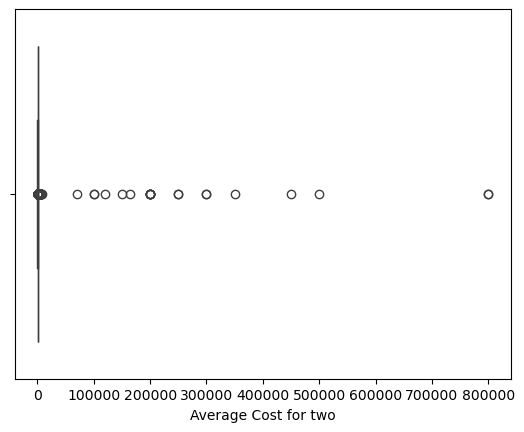

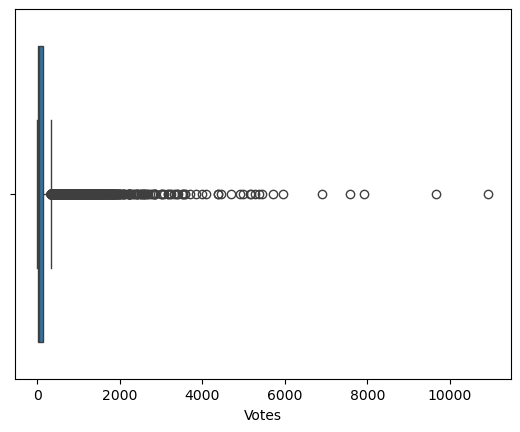

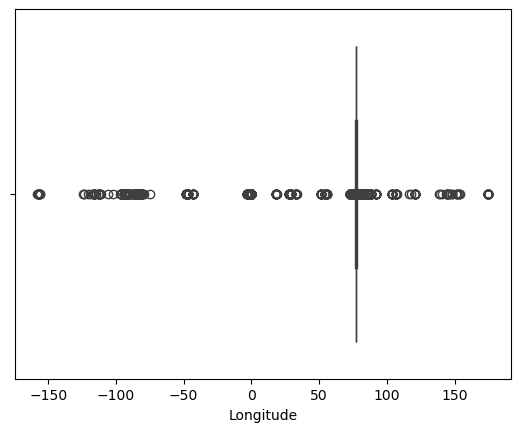

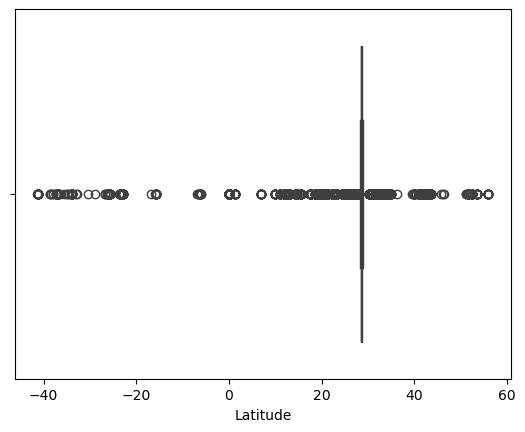

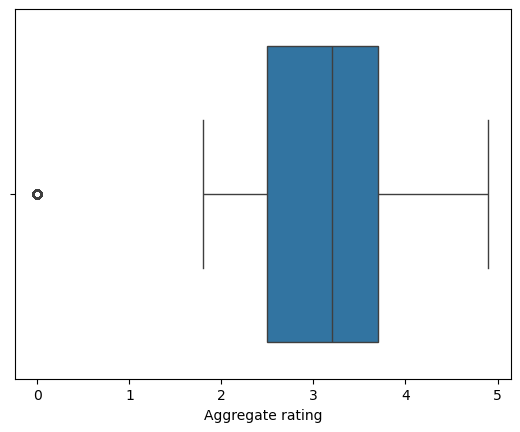

In [43]:
for i in ['Average Cost for two','Votes','Longitude','Latitude','Aggregate rating']:
    sns.boxplot(data = df, x = i)
    plt.show()

In [44]:
import copy
df1 = copy.deepcopy(df)

## TASK :- 2

In [45]:
print(f"There are {df['Currency'].nunique()} different types of Currency present")
df['Currency'].unique()

There are 12 different types of Currency present


array(['Botswana Pula(P)', 'Brazilian Real(R$)', 'Dollar($)',
       'Emirati Diram(AED)', 'Indian Rupees(Rs.)',
       'Indonesian Rupiah(IDR)', 'NewZealand($)', 'Pounds(��)',
       'Qatari Rial(QR)', 'Rand(R)', 'Sri Lankan Rupee(LKR)',
       'Turkish Lira(TL)'], dtype=object)

In [46]:
df[['Longitude','Latitude','Aggregate rating','Average Cost for two']].describe()

,Longitude,Latitude,Aggregate rating,Average Cost for two
count,9547.000000,9547.000000,9547.000000,9547.000000
mean,64.197569,25.851530,2.665832,1199.706924
std,41.325494,11.008073,1.516437,16124.542067
min,-157.948486,-41.330428,0.000000,0.000000
25%,77.081448,28.478713,2.500000,250.000000
50%,77.191982,28.570463,3.200000,400.000000
75%,77.282028,28.642747,3.700000,700.000000
max,174.832089,55.976980,4.900000,800000.000000


#### 1. Longitude and Latitude (Location Information)
- **Mean Longitude (64.2)** and **Latitude (25.85) :**
  - These averages indicate a general central location for the restaurants, but they may not align with any specific city due to global coverage.
- **Range :**
  - Longitude ranges from -157.95 (Western Hemisphere) to 174.83 (Eastern Hemisphere).
  - Latitude ranges from -41.33 (Southern Hemisphere) to 55.98 (Northern Hemisphere).
  - This highlights that restaurants are spread across multiple continents and hemispheres.
#### 2. Aggregate Rating (Customer Feedback)
- **Mean :** The average rating is 2.67 out of 5, indicating that most restaurants fall in the mid-to-low range of customer satisfaction.
- **Standard Deviation (1.52) :** Ratings are widely distributed, meaning there is significant variation in how customers perceive different restaurants.
- **Range :**
  - **Minimum Rating (0.0) :** Indicates unrated or very poorly rated restaurants.
  - **Maximum Rating (4.9) :** Indicates a handful of restaurants are rated exceptionally well.
- **Median (3.2) :** Half of the restaurants have a rating of 3.2 or lower, signifying that most restaurants are considered average.
- **Insight :**
  - The majority of restaurants are average to slightly above average.
  - Efforts can be focused on improving the ratings for low-performing restaurants (rating ≤ 2.5).
#### 3. Average Cost for Two
- The mean cost is 1199.21, but the standard deviation is very high (16,121.18), indicating a wide range in restaurant pricing.
- The minimum cost is 0, which may indicate missing or incorrect data.
- The maximum cost is 800,000, which is likely an outlier or error.
- The median cost is 400, suggesting that most restaurants are moderately priced.
- The IQR (250–700) suggests that 50% of restaurants have a cost for two between ₹250 and ₹700.

In [47]:
df.groupby('Currency')['Average Cost for two'].describe()

,count,mean,std,min,25%,50%,75%,max
Currency,,,,,,,,
Botswana Pula(P),22.0,1606.818182,1268.510136,600.0,862.50,1150.0,1725.0,6000.0
Brazilian Real(R$),60.0,134.666667,86.831547,30.0,70.00,100.0,177.5,400.0
Dollar($),478.0,31.648536,42.004716,0.0,10.00,25.0,40.0,500.0
Emirati Diram(AED),60.0,166.416667,109.969532,40.0,88.75,145.0,235.0,500.0
Indian Rupees(Rs.),8652.0,623.370319,595.676124,0.0,300.00,450.0,700.0,8000.0
Indonesian Rupiah(IDR),21.0,281190.476190,203543.022245,70000.0,165000.00,200000.0,300000.0,800000.0
NewZealand($),40.0,69.750000,37.824663,20.0,50.00,60.0,90.0,200.0
Pounds(��),80.0,47.812500,34.520621,10.0,30.00,40.0,55.0,230.0
Qatari Rial(QR),20.0,223.750000,147.905331,50.0,107.50,185.0,262.5,550.0


##### **Botswana Pula (P)**
- **Mean (1606.82):** Restaurants in Botswana have relatively high average costs compared to other currencies.
- **Wide range (600 to 6000):** Indicates a diverse range of restaurant pricing, from affordable to premium dining options.
- **Insight:** Botswana likely has a smaller number of restaurants catering to a mix of mid-range and high-end diners.
##### **Brazilian Real (`R$`) :**
- **Mean (134.67):** Restaurants in Brazil are relatively affordable, with low average costs.
- **Small range (30 to 400):** Indicates that restaurants mostly cater to budget-friendly dining.
- **Insight:** The restaurant market in Brazil appears to target casual or everyday diners rather than luxury dining experiences.
##### **Dollar ($)**
- **Mean (31.65):** Restaurants operating in countries using dollars are highly affordable.
- **Wide range (0 to 500):** Suggests the presence of both budget and premium restaurants.
- **Insight:** Many restaurants in dollar-using countries fall into the affordable category, but there are niche premium options available.
##### **Emirati Dirham (AED)**
- **Mean (166.42):** Restaurants in the UAE have moderate pricing compared to other regions.
- **Range (40 to 500):** Suggests the market has a good mix of casual and mid-range options, with limited high-end restaurants.
- **Insight:** UAE’s dining scene caters mostly to mid-range diners.
##### **Indian Rupees (Rs.)**
- **Mean (623.37):** Restaurants in India are moderately priced.
- **Wide range (0 to 8000):** Reflects a vast market catering to all price segments, from budget-friendly to premium luxury.
- **Insight:** India’s restaurant market is highly diverse, with something available for every budget.
##### **Indonesian Rupiah (IDR)**
- **Mean (281,190):** Restaurants in Indonesia are relatively affordable despite the high numeric value due to currency denomination differences.
- **Range (70,000 to 800,000):** Indicates most restaurants fall in a narrow range, catering to casual dining.
- **Insight:** Indonesian restaurants primarily serve affordable dining experiences, with limited high-end options.
##### **New Zealand Dollar (NZD)**
- **Mean (69.75):** Restaurants in New Zealand are affordable to moderately priced.
- **Range (20 to 200):** Indicates a focus on casual dining with some mid-range options.
- **Insight:** New Zealand’s restaurant scene leans toward affordable dining with few luxury establishments.
##### **Pounds (£)**
- **Mean (47.81):** Restaurants in pound-using regions are affordable, with moderate prices.
- **Range (10 to 230):** Reflects a mix of budget-friendly and mid-range restaurants.
- **Insight:** Pound-using countries focus on catering to everyday dining with limited premium options.
##### **Qatari Rial (QR)**
- **Mean (223.75):** Restaurants in Qatar have moderate pricing.
- **Range (50 to 550):** Suggests that most restaurants target mid-range customers, with few affordable or high-end options.
- **Insight:** Qatar’s restaurant scene focuses on mid-level dining experiences.
##### **Rand (R)**
- **Mean (419.73):** Restaurants in South Africa offer moderate pricing.
- **Wide range (110 to 3210):** Indicates a mix of budget, mid-range, and premium dining options.
- **Insight:** South Africa has a well-balanced market catering to all types of customers.
##### **Sri Lankan Rupee (LKR)**
- **Mean (2375):** Restaurants in Sri Lanka are moderately priced.
- **Range (1000 to 4500):** Indicates a focus on mid-range to high-end dining options.
- **Insight:** Sri Lanka’s dining market leans more toward quality dining experiences, with fewer budget-friendly options.
##### **Turkish Lira (TL)**
- **Mean (84.85):** Restaurants in Turkey are affordable.
- **Range (30 to 400):** Most restaurants cater to budget or casual dining customers.
- **Insight:** Turkey’s restaurant market focuses primarily on affordable dining experiences.
#### Overall Patterns
##### **Diversity of Pricing**
- The dataset captures a wide variety of dining options, from affordable (e.g., Dollar, Brazilian Real) to premium luxury (e.g., Botswana Pula, Indian Rupees).
##### **Currency Impact**
- The wide variation in "Average Cost for Two" across currencies reflects differences in purchasing power and local dining preferences.
##### **Affordability vs. Luxury**
- Currencies like the Brazilian Real, Dollar, and Turkish Lira lean toward affordability.
- Currencies like the Botswana Pula, Sri Lankan Rupee, and Indian Rupees showcase significant luxury dining options.
##### **Targeted Customer Segments**
- Countries like India, South Africa, and Botswana appear to cater to all customer segments (budget, mid-range, and premium).
- Countries like Brazil and Turkey focus heavily on budget-friendly dining.

There are 15 different countries present
Categorizing Cities by Country Code :

Country Code
1      [Agra, Ahmedabad, Allahabad, Amritsar, Auranga...
14     [Armidale, Balingup, Beechworth, Dicky Beach, ...
30               [Bras�_lia, Rio de Janeiro, S��o Paulo]
37     [Chatham-Kent, Consort, Vineland Station, York...
94                  [Bandung, Bogor, Jakarta, Tangerang]
148                          [Auckland, Wellington City]
162    [Makati City, Mandaluyong City, Pasay City, Pa...
166                                               [Doha]
184                                          [Singapore]
189    [Cape Town, Inner City, Johannesburg, Pretoria...
191                                            [Colombo]
208                                  [Ankara, ��stanbul]
214                          [Abu Dhabi, Dubai, Sharjah]
215          [Birmingham, Edinburgh, London, Manchester]
216    [Albany, Athens, Augusta, Boise, Cedar Rapids/...
Name: City, dtype: object


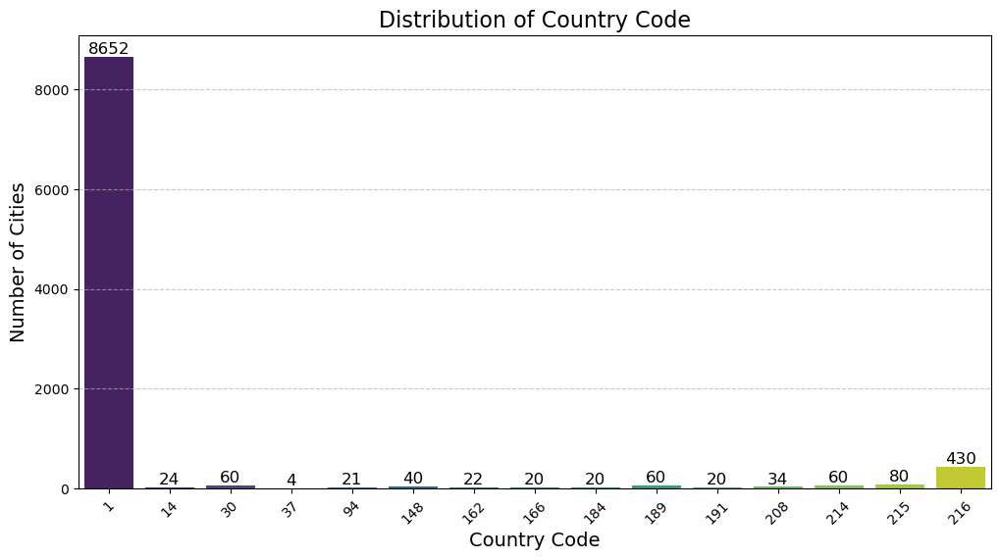

In [48]:
print(f"There are {df['Country Code'].nunique()} different countries present")
df['Country Code'].unique()
print("Categorizing Cities by Country Code :\n")
print(df.groupby('Country Code')['City'].unique())
plt.figure(figsize=(12, 6))
ax = sns.countplot(x = 'Country Code', data = df, palette="viridis")
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Distribution of Country Code", fontsize=16)
plt.xlabel("Country Code", fontsize=14)
plt.ylabel("Number of Cities", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

There are 140 different City present
Categorizing Cities by Country Code :

Country Code
1      [Agra, Ahmedabad, Allahabad, Amritsar, Auranga...
14     [Armidale, Balingup, Beechworth, Dicky Beach, ...
30               [Bras�_lia, Rio de Janeiro, S��o Paulo]
37     [Chatham-Kent, Consort, Vineland Station, York...
94                  [Bandung, Bogor, Jakarta, Tangerang]
148                          [Auckland, Wellington City]
162    [Makati City, Mandaluyong City, Pasay City, Pa...
166                                               [Doha]
184                                          [Singapore]
189    [Cape Town, Inner City, Johannesburg, Pretoria...
191                                            [Colombo]
208                                  [Ankara, ��stanbul]
214                          [Abu Dhabi, Dubai, Sharjah]
215          [Birmingham, Edinburgh, London, Manchester]
216    [Albany, Athens, Augusta, Boise, Cedar Rapids/...
Name: City, dtype: object


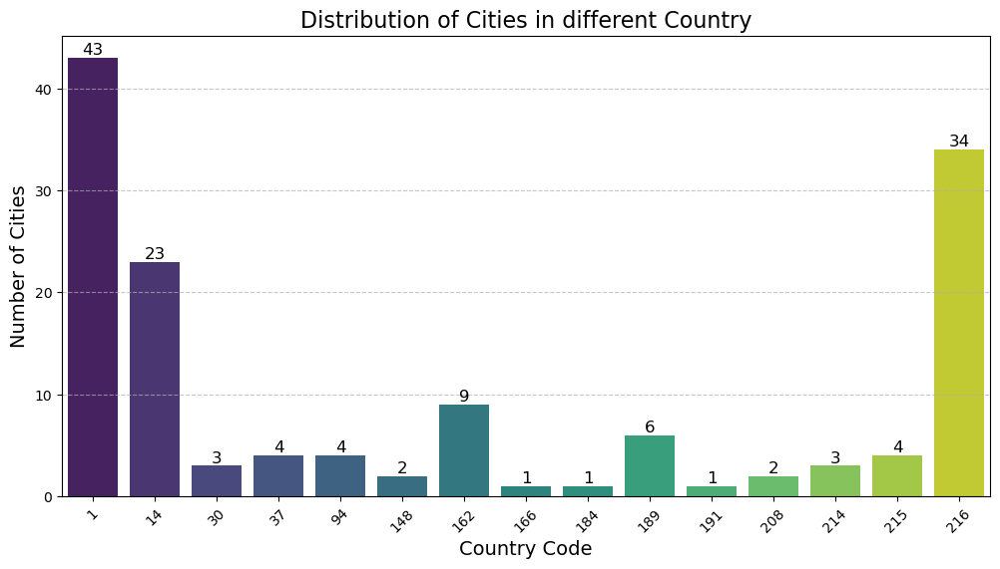

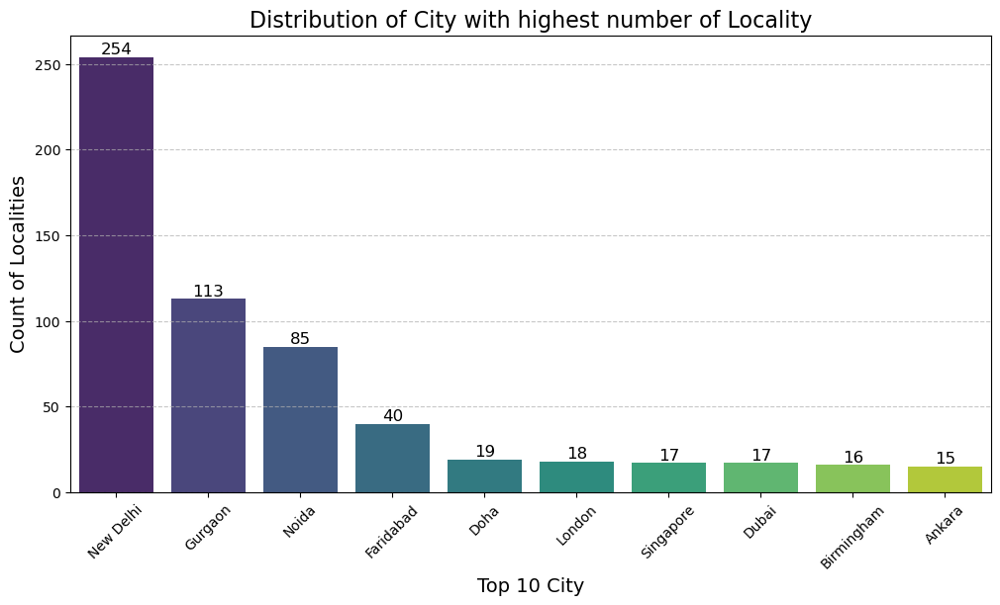

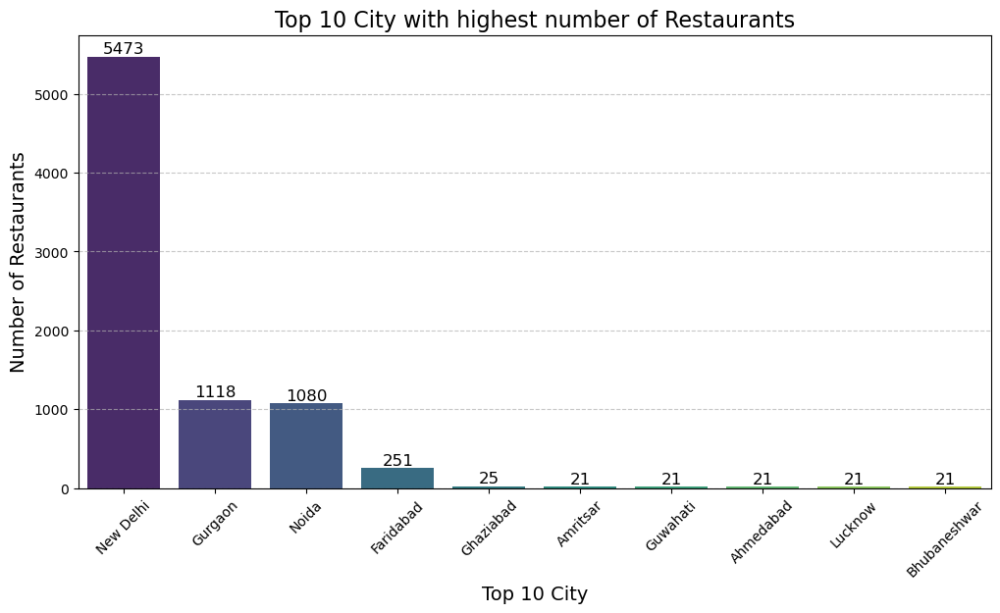

In [49]:
print(f"There are {df['City'].nunique()} different City present")
df['City'].unique()
print("Categorizing Cities by Country Code :\n")
print(df.groupby('Country Code')['City'].unique())
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df.groupby('Country Code')['City'].nunique().index,
    y=df.groupby('Country Code')['City'].nunique().values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Distribution of Cities in different Country", fontsize=16)
plt.xlabel("Country Code", fontsize=14)
plt.ylabel("Number of Cities", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df.groupby('City')['Locality'].nunique().sort_values(ascending=False).head(10).index,
    y=df.groupby('City')['Locality'].nunique().sort_values(ascending=False).head(10).values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Distribution of City with highest number of Locality", fontsize=16)
plt.xlabel("Top 10 City", fontsize=14)
plt.ylabel("Count of Localities", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df.groupby('City')['Restaurant Name'].count().sort_values(ascending=False).head(10).index,
    y=df.groupby('City')['Restaurant Name'].count().sort_values(ascending=False).head(10).values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Top 10 City with highest number of Restaurants", fontsize=16)
plt.xlabel("Top 10 City", fontsize=14)
plt.ylabel("Number of Restaurants", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [50]:
df['Cuisines'].unique()

array(['French, Japanese, Desserts', 'Japanese',
       'Seafood, Asian, Filipino, Indian', ..., 'Burger, Izgara',
       'World Cuisine, Patisserie, Cafe', 'Italian, World Cuisine'],
      dtype=object)

**In these many cuisines are mixed up. Lets separate the cuisines and Analyze it**

There are 145 unique Cuisines.

['French' 'Japanese' 'Desserts' 'Seafood' 'Asian' 'Filipino' 'Indian'
 'Sushi' 'Korean' 'Chinese' 'European' 'Mexican' 'American' 'Ice Cream'
 'Cafe' 'Italian' 'Pizza' 'Bakery' 'Mediterranean' 'Fast Food' 'Brazilian'
 'Arabian' 'Bar Food' 'Grill' 'International' 'Peruvian' 'Latin American'
 'Burger' 'Juices' 'Healthy Food' 'Beverages' 'Lebanese' 'Sandwich'
 'Steak' 'BBQ' 'Gourmet Fast Food' 'Mineira' 'North Eastern'
 'Coffee and Tea' 'Vegetarian' 'Tapas' 'Breakfast' 'Diner' 'Southern'
 'Southwestern' 'Spanish' 'Argentine' 'Caribbean' 'German' 'Vietnamese'
 'Thai' 'Modern Australian' 'Teriyaki' 'Cajun' 'Canadian' 'Tex-Mex'
 'Middle Eastern' 'Greek' 'Bubble Tea' 'Tea' 'Australian' 'Fusion' 'Cuban'
 'Hawaiian' 'Salad' 'Irish' 'New American' 'Soul Food' 'Turkish'
 'Pub Food' 'Persian' 'Continental' 'Singaporean' 'Malay' 'Cantonese'
 'Dim Sum' 'Western' 'Finger Food' 'British' 'Deli' 'Indonesian'
 'North Indian' 'Mughlai' 'Biryani' 'South Indian' 'Pakistani' 

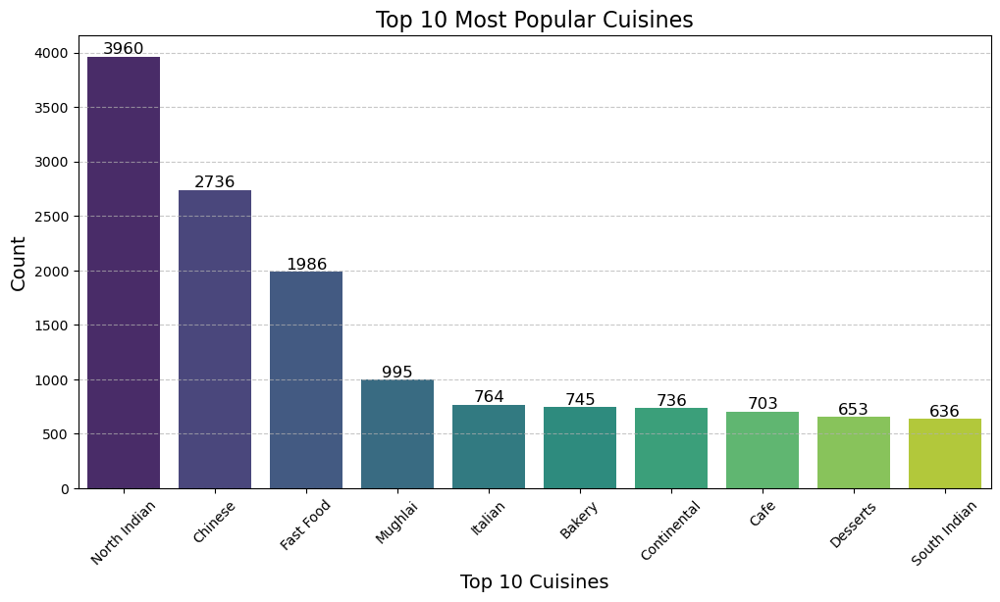

In [51]:
cuisines = df['Cuisines'].str.split(', ').explode()
print(f"There are {cuisines.nunique()} unique Cuisines.\n")
print(cuisines.unique())
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=cuisines.value_counts().sort_values(ascending=False).head(10).index,
    y=cuisines.value_counts().sort_values(ascending=False).head(10).values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Top 10 Most Popular Cuisines", fontsize=16)
plt.xlabel("Top 10 Cuisines", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## TASK :- 3

In [52]:
import folium
from folium.plugins import MarkerCluster
from IPython.display import display

# Create a base map
base_map = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

# Add a marker cluster for better visualization of restaurant locations
marker_cluster = MarkerCluster().add_to(base_map)

# Add restaurant markers to the map
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Name: {row['Restaurant Name']}<br>City: {row['City']}<br>Rating: {row['Aggregate rating']}",
    ).add_to(marker_cluster)

# Display the map directly in Jupyter Notebook
display(base_map)

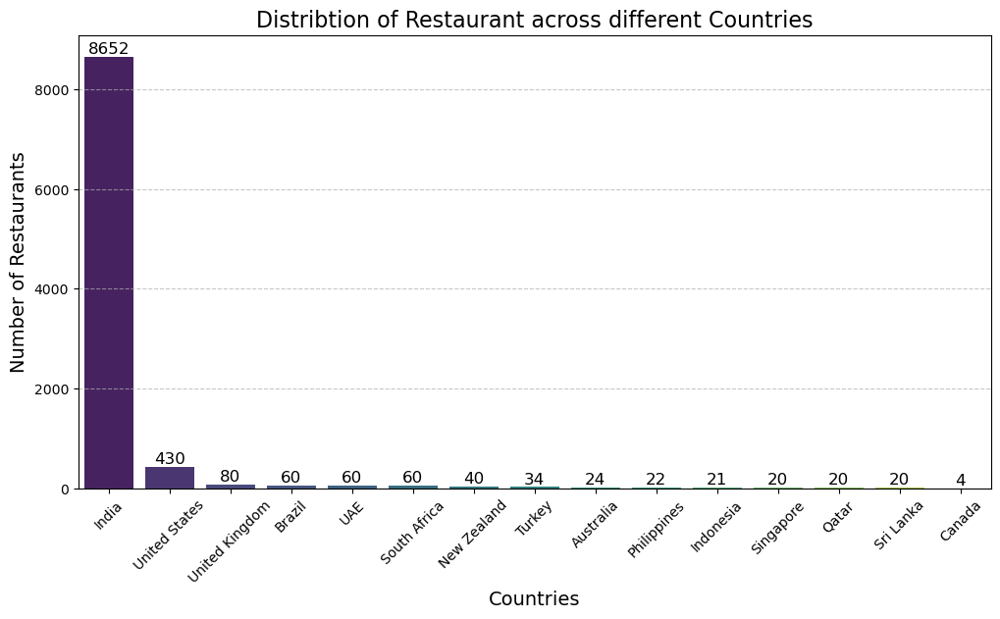

In [53]:
country_mapping = {
    1: "India", 14: "Australia", 30: "Brazil", 37: "Canada", 94: "Indonesia",
    148: "New Zealand", 162: "Philippines", 166: "Qatar", 184: "Singapore",
    189: "South Africa", 191: "Sri Lanka", 208: "Turkey", 214: "UAE",
    215: "United Kingdom", 216: "United States"
}
df["Country"] = df["Country Code"].map(country_mapping)
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df['Country'].value_counts().index,
    y=df['Country'].value_counts().values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Distribtion of Restaurant across different Countries", fontsize=16)
plt.xlabel("Countries", fontsize=14)
plt.ylabel("Number of Restaurants", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

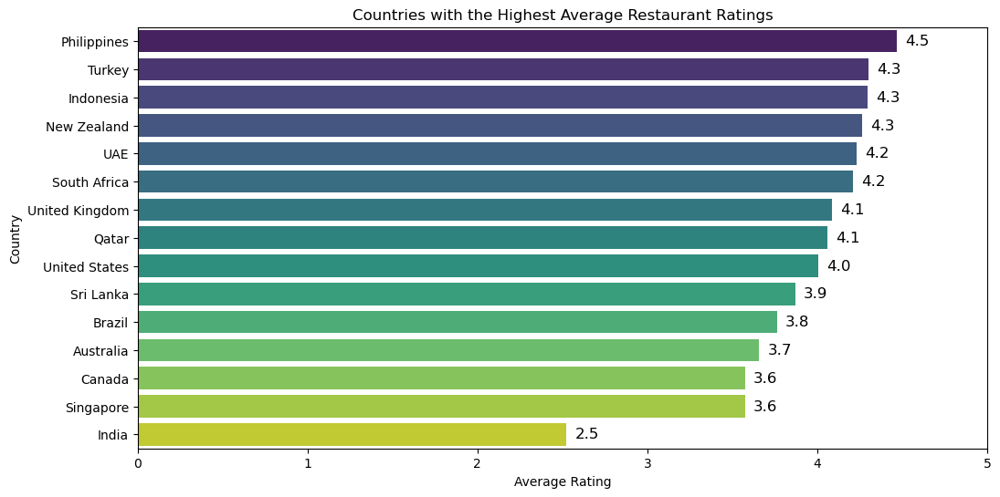

In [54]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df.groupby("Country")["Aggregate rating"].mean().sort_values(ascending=False).values,
    y=df.groupby("Country")["Aggregate rating"].mean().sort_values(ascending=False).index,
    palette="viridis"
)
for p in ax.patches:
    ax.annotate(
        f'{p.get_width():.1f}',
        (p.get_width() + 0.05, p.get_y() + p.get_height() / 2),  
        ha='left', va='center', 
        fontsize=12, color='black'
    )
plt.xlabel("Average Rating")
plt.ylabel("Country")
plt.title("Countries with the Highest Average Restaurant Ratings")
plt.xlim(0, 5)
plt.show()

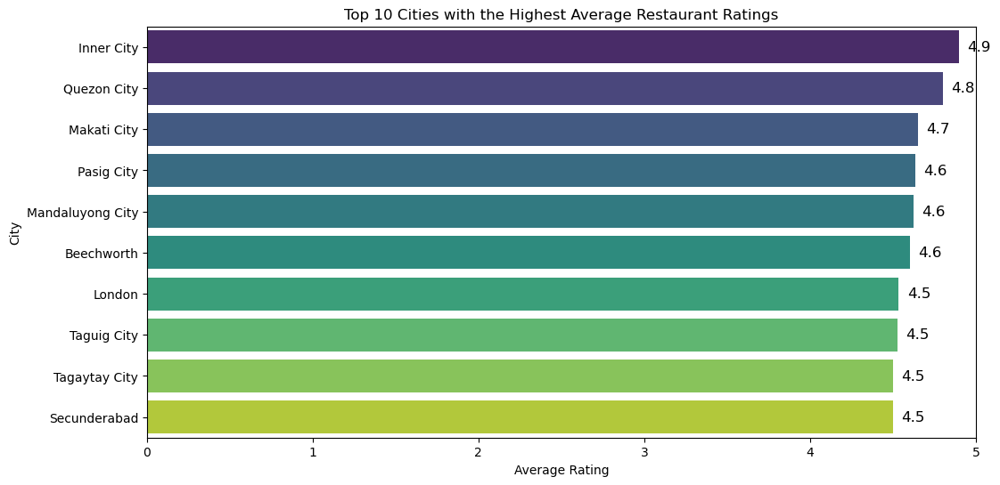

In [55]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False).head(10).values,
    y=df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False).head(10).index,
    palette="viridis"
)
for p in ax.patches:
    ax.annotate(
        f'{p.get_width():.1f}',
        (p.get_width() + 0.05, p.get_y() + p.get_height() / 2),  
        ha='left', va='center', 
        fontsize=12, color='black'
    )
plt.xlabel("Average Rating")
plt.ylabel("City")
plt.title("Top 10 Cities with the Highest Average Restaurant Ratings")
plt.xlim(0, 5)
plt.show()

# LEVEL 2 :
## TASK 1 :-

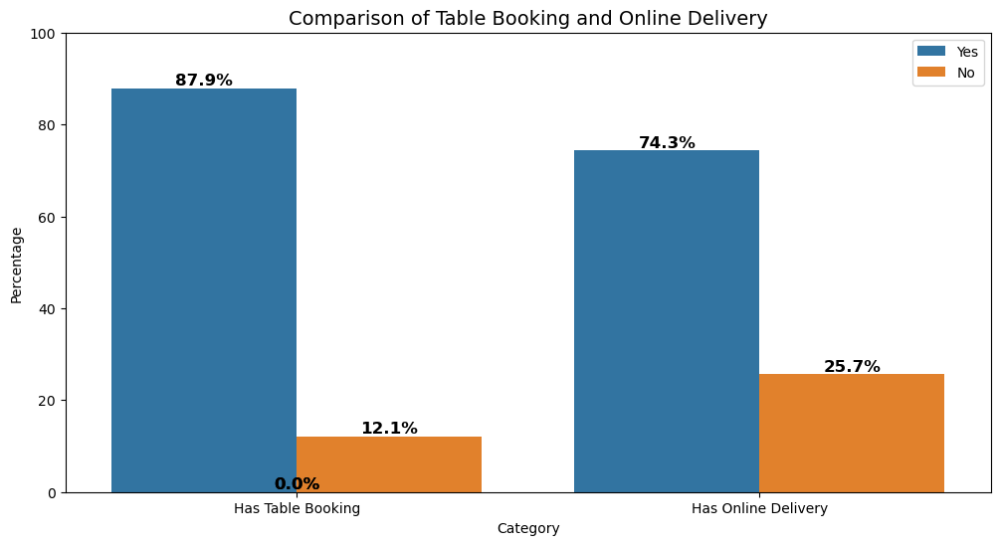

In [56]:
table_booking = df['Has Table booking'].value_counts(normalize=True) * 100
online_delivery = df['Has Online delivery'].value_counts(normalize=True) * 100
plot_df = pd.DataFrame({
    'Category': ['Has Table Booking'] * 2 + ['Has Online Delivery'] * 2,
    'Response': ['Yes', 'No'] * 2,
    'Percentage': list(table_booking) + list(online_delivery)
})
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Category', y='Percentage', hue='Response', data=plot_df, palette=['#1f77b4', '#ff7f0e'])
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', 
                (p.get_x() + p.get_width() / 2, p.get_height()), 
                ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.title('Comparison of Table Booking and Online Delivery', fontsize=14)
plt.ylabel('Percentage')
plt.ylim(0, 100)
plt.legend()
plt.show()

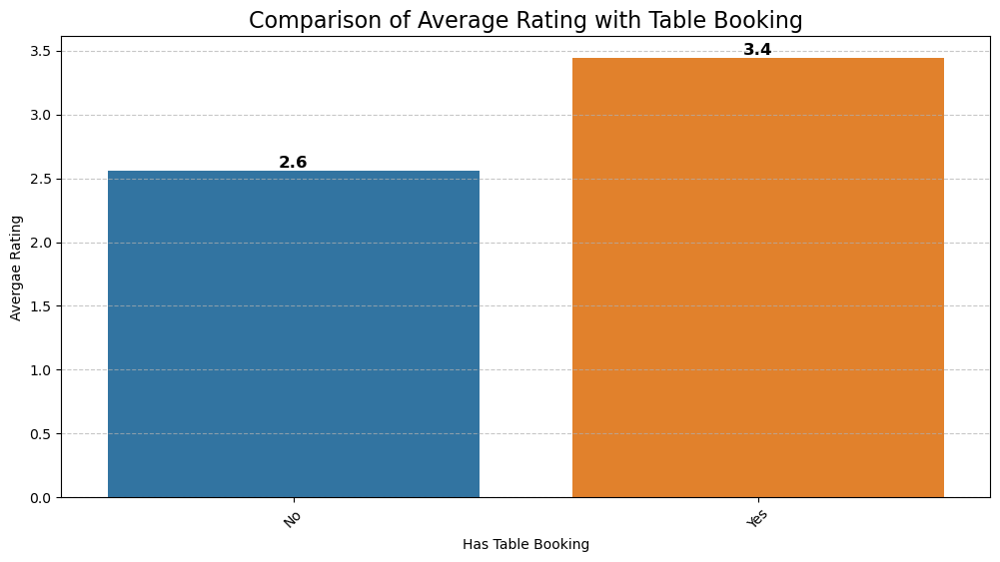

In [57]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df.groupby('Has Table booking')['Aggregate rating'].mean().index,
    y=df.groupby('Has Table booking')['Aggregate rating'].mean().values,
    palette=['#1f77b4', '#ff7f0e']
)
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.1f}',  # Format to 1 decimal place
        (p.get_x() + p.get_width() / 2, p.get_height()),  # Center text above bar
        ha='center', va='bottom',  # Align center and place above the bar
        fontsize=12, color='black', fontweight='bold'
    )
plt.title("Comparison of Average Rating with Table Booking", fontsize=16)
plt.xlabel("Has Table Booking")
plt.ylabel("Avergae Rating")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

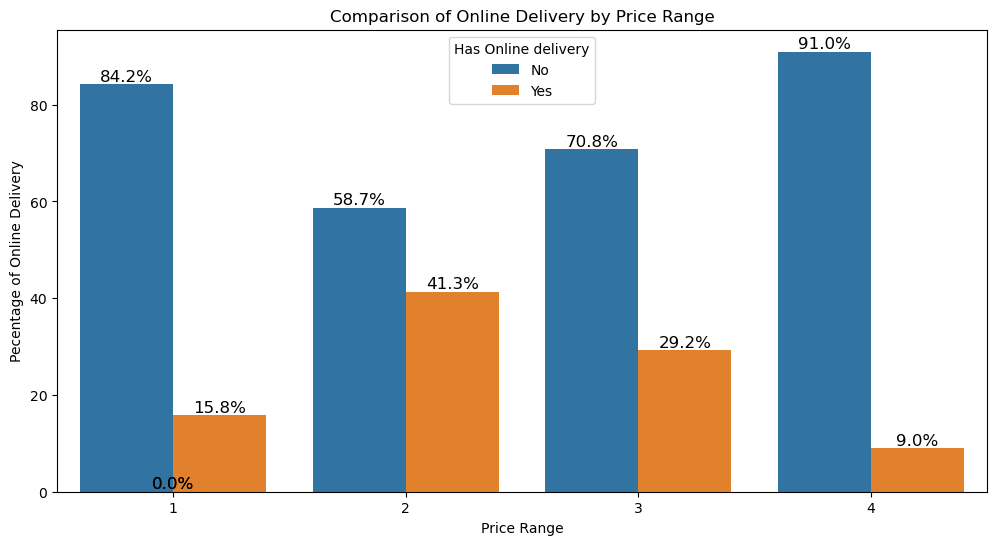

In [58]:
plt.figure(figsize = (12,6))
ax = sns.barplot(x = 'Price range', 
            y = 'Percentage', 
            hue = 'Has Online delivery', 
            data = df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True).mul(100).reset_index(name='Percentage'),
            palette = ['#1f77b4', '#ff7f0e']
            )
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', 
                (p.get_x() + p.get_width() / 2, p.get_height()), 
                ha='center', va='bottom', fontsize=12)
plt.title("Comparison of Online Delivery by Price Range")
plt.xlabel("Price Range")
plt.ylabel("Pecentage of Online Delivery")
plt.show()

## TASK 2 :-

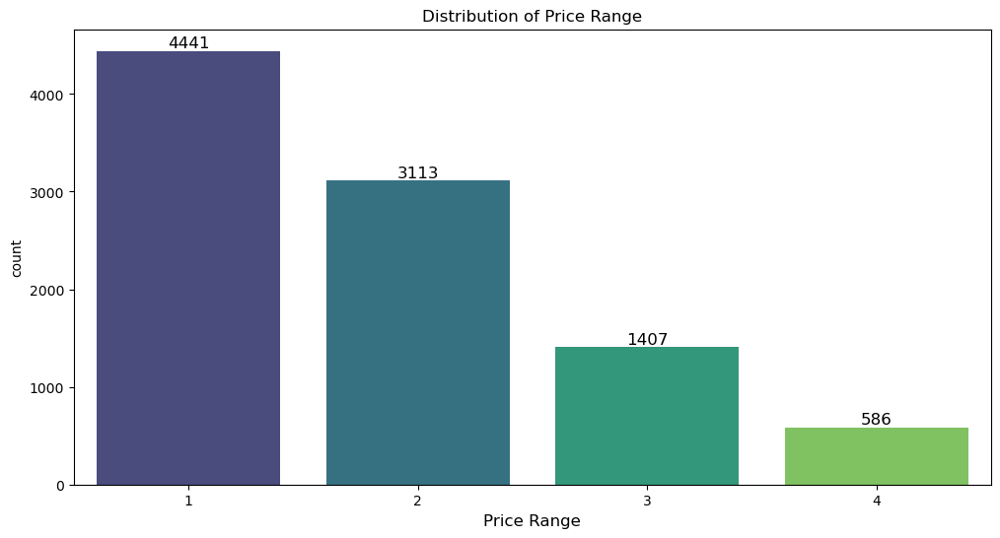

In [59]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=df, x='Price range', palette='viridis')
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(f'{count}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=12, color='black')   
plt.title('Distribution of Price Range', fontsize=12)
plt.xlabel('Price Range', fontsize=12)
plt.show()

In [60]:
df.groupby('Price range')['Aggregate rating'].mean()

Price range
1    1.998536
2    2.941054
3    3.683298
4    3.817918
Name: Aggregate rating, dtype: float64

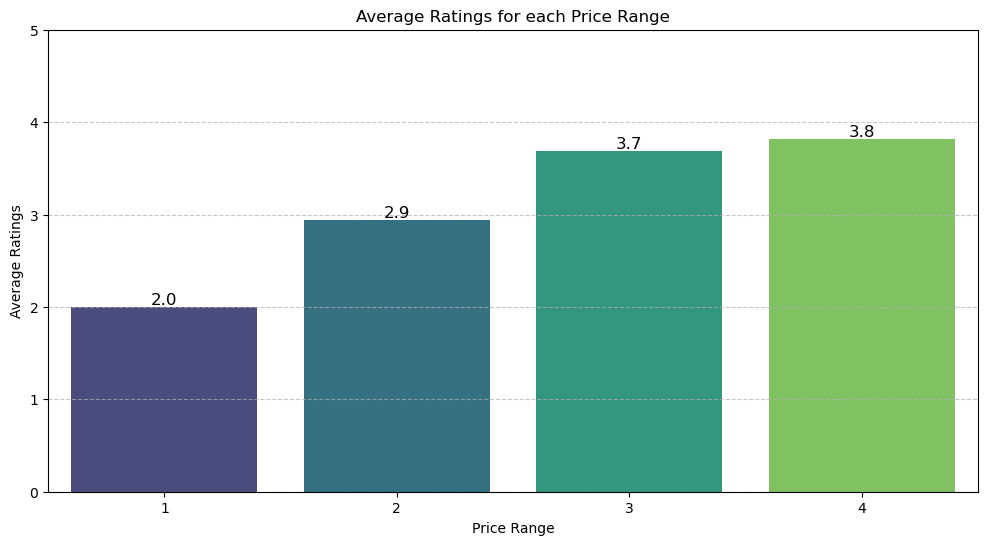

In [61]:
plt.figure(figsize = (12,6))
ax = sns.barplot(x = df.groupby('Price range')['Aggregate rating'].mean().index,
                 y = df.groupby('Price range')['Aggregate rating'].mean().values,
                 palette = 'viridis')
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.1f}',
        (p.get_x() + p.get_width() / 2, p.get_height()),  
        ha='center', va='bottom', 
        fontsize=12, color='black'
    )
plt.title('Average Ratings for each Price Range', fontsize=12)
plt.xlabel('Price Range')
plt.ylabel('Average Ratings')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ylim(0, 5)
plt.show()

In [62]:
highest_price_range = df.groupby('Price range')['Aggregate rating'].mean().index.max()
highest_rating_value = round(df.groupby('Price range')['Aggregate rating'].mean().values.max(),1)
color = df[df['Aggregate rating'] == highest_rating_value]['Rating color'].mode()[0]
print(f"The Highest Price Range is {highest_price_range} with Average Rating of {highest_rating_value} and corresponding Colour is {color}")

The Highest Price Range is 4 with Average Rating of 3.8 and corresponding Colour is Yellow


## TASK 3 :-

In [63]:
df["Restaurant_Name_Length"] = df["Restaurant Name"].apply(len)
df["Address_Length"] = df["Address"].apply(len)

In [64]:
df["Has Table booking"] = df["Has Table booking"].map({"Yes": 1, "No": 0})
df["Has Online delivery"] = df["Has Online delivery"].map({"Yes": 1, "No": 0})

In [65]:
df.T

,0,1,2,3,4,5,6,7,8,9,...,9537,9538,9539,9540,9541,9542,9543,9544,9545,9546
Restaurant ID,6317637,6304287,6300002,6318506,6314302,18189371,6300781,6301290,6300010,6314987,...,5905215,5926979,5916085,5915547,5915054,5915730,5908749,5915807,5916112,5927402
Restaurant Name,Le Petit Souffle,Izakaya Kikufuji,Heat - Edsa Shangri-La,Ooma,Sambo Kojin,Din Tai Fung,Buffet 101,Vikings,Spiral - Sofitel Philippine Plaza Manila,Locavore,...,Emirgan S�_ti��,Leman K�_lt�_r,Dem Karak�_y,Karak�_y G�_ll�_o��lu,Baltazar,Naml۱ Gurme,Ceviz A��ac۱,Huqqa,A���k Kahve,Walter's Coffee Roastery
Country Code,162,162,162,162,162,162,162,162,162,162,...,208,208,208,208,208,208,208,208,208,208
City,Makati City,Makati City,Mandaluyong City,Mandaluyong City,Mandaluyong City,Mandaluyong City,Pasay City,Pasay City,Pasay City,Pasig City,...,��stanbul,��stanbul,��stanbul,��stanbul,��stanbul,��stanbul,��stanbul,��stanbul,��stanbul,��stanbul
Address,"Third Floor, Century City Mall, Kalayaan Avenu...","Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Third Floor, Mega Fashion Hall, SM Megamall, O...","Third Floor, Mega Atrium, SM Megamall, Ortigas...","Ground Floor, Mega Fashion Hall, SM Megamall, ...","Building K, SM By The Bay, Sunset Boulevard, M...","Building B, By The Bay, Seaside Boulevard, Mal...","Plaza Level, Sofitel Philippine Plaza Manila, ...","Brixton Technology Center, 10 Brixton Street, ...",...,"Emirgan Mahallesi, Sak۱p Sabanc۱ Caddesi, No 4...","Cafera��a Mahallesi, Ne��et �_mer Sokak, No 9/...","Kemanke�� Karamustafa Pa��a Mahallesi, Hoca Ta...","Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...","Kemanke�� Karamustafa Pa��a Mahallesi, K۱l۱�_ ...","Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...","Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...","Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...","Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...","Cafea��a Mahallesi, Bademalt۱ Sokak, No 21/B, ..."
Locality,"Century City Mall, Poblacion, Makati City","Little Tokyo, Legaspi Village, Makati City","Edsa Shangri-La, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay City","Sofitel Philippine Plaza Manila, Pasay City",Kapitolyo,...,Emirg��n,Kad۱k�_y Merkez,Karak�_y,Karak�_y,Karak�_y,Karak�_y,Ko��uyolu,Kuru�_e��me,Kuru�_e��me,Moda
Locality Verbose,"Century City Mall, Poblacion, Makati City, Mak...","Little Tokyo, Legaspi Village, Makati City, Ma...","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...","SM Megamall, Ortigas, Mandaluyong City, Mandal...","SM Megamall, Ortigas, Mandaluyong City, Mandal...","SM Megamall, Ortigas, Mandaluyong City, Mandal...","SM by the Bay, Mall of Asia Complex, Pasay Cit...","SM by the Bay, Mall of Asia Complex, Pasay Cit...","Sofitel Philippine Plaza Manila, Pasay City, P...","Kapitolyo, Pasig City",...,"Emirg��n, ��stanbul","Kad۱k�_y Merkez, ��stanbul","Karak�_y, ��stanbul","Karak�_y, ��stanbul","Karak�_y, ��stanbul","Karak�_y, ��stanbul","Ko��uyolu, ��stanbul","Kuru�_e��me, ��stanbul","Kuru�_e��me, ��stanbul","Moda, ��stanbul"
Longitude,121.027535,121.014101,121.056831,121.056475,121.057508,121.056314,120.979667,120.979333,120.98009,121.056532,...,29.05662,29.022805,28.978237,28.977636,28.981103,28.977392,29.041297,29.03464,29.036019,29.026016
Latitude,14.565443,14.553708,14.581404,14.585318,14.58445,14.583764,14.531333,14.54,14.55299,14.572041,...,41.104969,40.989705,41.024633,41.022904,41.025785,41.022793,41.009847,41.055817,41.057979,40.984776
Cuisines,"French, Japanese, Desserts",Japanese,"Seafood, Asian, Filipino, Indian","Japanese, Sushi","Japanese, Korean",Chinese,"Asian, European","Seafood, Filipino, Asian, European","European, Asian, Indian",Filipino,...,"Restaurant Cafe, Turkish, Desserts",Restaurant Cafe,Cafe,"Desserts, B�_rek","Burger, Izgara",Turkish,"World Cuisin

# LEVEL 3 :
## TASK 1 :-

#### Necessary Pre-Processing Steps for Predictive Model

In [66]:
df["Is delivering now"] = df["Is delivering now"].map({"Yes": 1, "No": 0})

In [67]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Rating color'] = le.fit_transform(df['Rating color'])
df['Rating text'] = le.fit_transform(df['Rating text'])

In [68]:
df.drop(columns = ['Restaurant ID', 'Restaurant Name','Country Code','City','Address','Locality','Locality Verbose','Longitude','Latitude','Cuisines',
                   'Currency','Switch to order menu','Country','Restaurant_Name_Length','Address_Length',],
                   axis = 1,inplace = True)

In [69]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df[['Average Cost for two','Votes']] = scaler.fit_transform(df[['Average Cost for two','Votes']])

In [70]:
df

,Average Cost for two,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes
0,-0.006184,1,0,0,3,4.8,0,1,0.365283
1,0.000018,1,0,0,3,4.5,0,1,1.009179
2,0.173676,1,0,0,4,4.4,1,5,0.263004
3,0.018624,0,0,0,4,4.9,0,1,0.483835
4,0.018624,1,0,0,4,4.8,0,1,0.167698
...,...,...,...,...,...,...,...,...,...
9542,-0.069445,0,0,0,3,4.1,1,5,1.467112
9543,-0.067894,0,0,0,3,4.2,1,5,2.038946
9544,-0.063863,0,0,0,4,3.7,5,2,1.171896
9545,-0.066964,0,0,0,4,4.0,1,5,1.729784


### DATA PREPARATION

In [71]:
X = df.drop('Aggregate rating',axis=1)
y = df['Aggregate rating']

In [72]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [73]:
Train = []
CV = []
for i in range (0,500):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)
    
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    ypred_train = model.predict(X_train)
    
    Train.append(r2_score(y_train, ypred_train))
    
    CV.append(cross_val_score(model, X_train, y_train, cv = 5).mean())

em = pd.DataFrame({"Train" : Train, "CV" : CV})
gm = em[(abs(em['Train']-em['CV'])<=0.05)]
rs = gm[gm["CV"]==gm["CV"].max()].index.tolist()[0]
print("Best Random State Number :",rs)

Best Random State Number : 69


In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=69)

## MODELING

### 1. MULTIPLE LINEAR REGRESSION

In [75]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [76]:
print("Intercept :",model.intercept_)
print("Coefficients :",model.coef_)
ypred_train = model.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(model,X_train,y_train,cv=5).mean())
ypred_test = model.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))

Intercept : 2.4154145890340706
Coefficients : [ 0.00591284 -0.27283818  0.60793946 -0.2491924   0.67410527 -0.24228971
 -0.21242192  0.32010913]

Train RMSE :  1.1743157812907175
Train Accuracy :  0.4048122997945153

Cross Validation Score :  0.40276101030754996

Test RMSE :  1.205486892539045
Test Accuracy :  0.3474953656405615


- **CONDITION 1 : Train Accuracy == Cross Validation Score (SATISFIED)**
- **CONDITION 2 : Train Accuracy(r2) != Test Accuracy(r2) (NOT SATISFIED within +- 5% range)**

### 2. LASSO REGRESSION

In [77]:
from sklearn.linear_model import Lasso

In [78]:
estimator = Lasso()
param_grid = {"alpha":list(range(1,100))}
lasso_gs = GridSearchCV(estimator,param_grid,scoring="r2",cv=5)
lasso_gs.fit(X_train,y_train)
lasso_gs.best_estimator_

Lasso(alpha=1)

In [79]:
model = lasso_gs.best_estimator_
model.fit(X_train, y_train)

Lasso(alpha=1)

In [80]:
print("Intercept :",model.intercept_)
print("Coefficients :",model.coef_)
ypred_train = model.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(model,X_train,y_train,cv=5).mean())
ypred_test = model.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))

Intercept : 2.656252455152547
Coefficients : [ 0.  0.  0.  0.  0. -0. -0.  0.]

Train RMSE :  1.5221516521435727
Train Accuracy :  0.0

Cross Validation Score :  -0.0006172087267056536

Test RMSE :  1.4931180103446502
Test Accuracy :  -0.0010295169060845488


### 3. RIDGE REGRESSION

In [81]:
from sklearn.linear_model import Ridge

In [82]:
estimator = Ridge()
param_grid = {"alpha":list(range(1,100))}
ridge_gs = GridSearchCV(estimator,param_grid,scoring="r2",cv=5)
ridge_gs.fit(X_train,y_train)
ridge_gs.best_estimator_

Ridge(alpha=17)

In [83]:
model = ridge_gs.best_estimator_
model.fit(X_train, y_train)

Ridge(alpha=17)

In [84]:
print("Intercept :",model.intercept_)
print("Coefficients :",model.coef_)
ypred_train = model.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(model,X_train,y_train,cv=5).mean())
ypred_test = model.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))

Intercept : 2.4224783360308004
Coefficients : [ 0.00605402 -0.2603403   0.59939603 -0.15688459  0.67018386 -0.24239768
 -0.21206474  0.3198962 ]

Train RMSE :  1.174340045525916
Train Accuracy :  0.4047877034742131

Cross Validation Score :  0.40280452522689353

Test RMSE :  1.205223126466887
Test Accuracy :  0.34778087642705025


### 4. ELASTIC NET REGRESSION

In [85]:
from sklearn.linear_model import ElasticNet

In [86]:
estimator = ElasticNet()
param_grid = {"alpha":list(range(1,100)),"l1_ratio":[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]}
en_gs = GridSearchCV(estimator,param_grid,scoring="r2",cv=5)
en_gs.fit(X_train,y_train)
en_gs.best_estimator_

ElasticNet(alpha=1, l1_ratio=0)

In [87]:
model = en_gs.best_estimator_
model.fit(X_train, y_train)

ElasticNet(alpha=1, l1_ratio=0)

In [88]:
print("Intercept :",model.intercept_)
print("Coefficients :",model.coef_)
ypred_train = model.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(model,X_train,y_train,cv=5).mean())
ypred_test = model.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))

Intercept : 2.947260900222158
Coefficients : [ 0.01728162  0.03577108  0.11123158  0.00109898  0.29704961 -0.20780648
 -0.13652688  0.1980353 ]

Train RMSE :  1.255572797361391
Train Accuracy :  0.31959429085911895

Cross Validation Score :  0.31871296432312607

Test RMSE :  1.249244314216164
Test Accuracy :  0.29926569642808976


### 5. POLYNOMIAL REGRESSION

In [89]:
from sklearn.preprocessing import PolynomialFeatures

In [90]:
train_r2 = []
test_r2 = []
max_r2_within_threshold = None  # To store the index of the maximum R² within threshold

for i in range(1, 11):
    polynomial_converter = PolynomialFeatures(degree=i)
    X_train_poly = pd.DataFrame(polynomial_converter.fit_transform(X_train))
    X_test_poly = pd.DataFrame(polynomial_converter.transform(X_test))
    
    model = LinearRegression()
    model.fit(X_train_poly, y_train)
    
    # Training R² score
    train_r2_score = model.score(X_train_poly, y_train)
    train_r2.append(train_r2_score)
    
    # Testing R² score
    test_r2_score = model.score(X_test_poly, y_test)
    test_r2.append(test_r2_score)
    
    # Check if the R² scores are within 5% or equal
    if np.abs(train_r2_score - test_r2_score) <= 0.05:
        # Check if this is the highest R² value within the threshold
        if max_r2_within_threshold is None or train_r2_score > train_r2[max_r2_within_threshold - 1]:
            max_r2_within_threshold = i  # Store the index (degree)

# Output the maximum R² value index where the train and test R² values are within 5%
if max_r2_within_threshold is not None:
    print(f"Maximum R² value within 5% or equal is at degree {max_r2_within_threshold}")
else:
    print("No R² values within 5% or equal found.")

Maximum R² value within 5% or equal is at degree 2


In [91]:
polynomial_converter = PolynomialFeatures(degree=2)
X_train_poly = pd.DataFrame(polynomial_converter.fit_transform(X_train))
X_test_poly = pd.DataFrame(polynomial_converter.transform(X_test))
    
model = LinearRegression()
model.fit(X_train_poly, y_train)

LinearRegression()

In [92]:
print("Intercept :",model.intercept_)
print("Coefficients :",model.coef_)
ypred_train = model.predict(X_train_poly)
print("Train RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train r2 : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(model,X_train_poly,y_train,cv=5).mean())
ypred_test = model.predict(X_test_poly)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test r2 : ",r2_score(y_test,ypred_test))

Intercept : 23.388780598892914
Coefficients : [-1.91457900e-13 -5.30390272e-01 -3.95636340e-03  1.13775751e-02
  1.55414410e-01  2.25107128e-02 -1.45687493e+01 -2.25560544e+01
  7.65650577e-02 -2.51283493e-04 -2.35987586e-01  1.48155843e-01
  2.66936118e+00  1.80988570e-01  1.77727552e-03 -1.02551708e-03
  2.06895769e-04 -3.95636340e-03  1.92250465e-02 -9.32587341e-15
 -8.68155387e-03  2.77863693e-03 -2.52553254e-03  2.51771440e-03
  1.13775751e-02  1.55414410e-01 -2.28367406e-02  1.31490986e-03
  2.93727452e-03  1.35133554e-02  1.55414410e-01 -1.32319829e-01
 -6.39020647e-02  4.16455316e-02  1.11028843e-01  7.15344102e-03
 -3.25789308e-03 -4.76555405e-03 -1.02017123e-02  2.19138462e+00
  2.87934618e+00  1.57597182e-04  3.65961863e+00 -4.06132158e-03
 -2.63711222e-03]
Train RMSE :  0.17625959339872996
Train r2 :  0.9865912071624929

Cross Validation Score :  0.9863958626197405

Test RMSE :  0.17960084398728382
Test r2 :  0.9855164387000226


### 6. KNN REGRESSION

In [93]:
from sklearn.neighbors import KNeighborsRegressor

In [94]:
estimator = KNeighborsRegressor()
param_grid = {'n_neighbors': range(1, 50),
              "p":[1,2]} 
knn_grid = GridSearchCV(estimator,param_grid,scoring='accuracy',cv=5)
knn_grid.fit(X_train, y_train)
knn_grid.best_estimator_

KNeighborsRegressor(n_neighbors=1, p=1)

In [95]:
knn_model = knn_grid.best_estimator_
knn_model.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=1, p=1)

In [96]:
ypred_train = knn_model.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(knn_model,X_train,y_train,cv=5).mean())
ypred_test = knn_model.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  0.12200047868672685
Train Accuracy :  0.9935759749970183

Cross Validation Score :  0.9740879832287754

Test RMSE :  0.23933809248234808
Test Accuracy :  0.9742793306628715


### 7. SVM REGRESSION

In [97]:
from sklearn.svm import SVR

In [98]:
estimator = SVR()
param_grid = {'C':[0.01,0.11,1],'kernel':['linear','rbf','sigmoid','poly']}
svr_grid = GridSearchCV(estimator,param_grid,scoring='accuracy',cv=5)
svr_grid.fit(X_train, y_train)
svr_grid.best_estimator_

SVR(C=0.01, kernel='linear')

In [99]:
svr_model = svr_grid.best_estimator_
svr_model.fit(X_train, y_train)

SVR(C=0.01, kernel='linear')

In [100]:
ypred_train = svr_model.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(svr_model,X_train,y_train,cv=5).mean())
ypred_test = svr_model.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  1.2847306131122385
Train Accuracy :  0.2876256088462469

Cross Validation Score :  0.28084649015925606

Test RMSE :  1.283721648336444
Test Accuracy :  0.26005345689571535


### 8. DECISSION TREE REGRESSION

In [101]:
from sklearn.tree import DecisionTreeRegressor

In [102]:
estimator = DecisionTreeRegressor()
param_grid = {"criterion":["squared_error", "absolute_error"], 
              "max_depth":list(range(1,16))}
dt_grid = GridSearchCV(estimator,param_grid,scoring='accuracy',cv=5)
dt_grid.fit(X_train, y_train)
dt = dt_grid.best_estimator_
dt

DecisionTreeRegressor(max_depth=1)

In [103]:
feats_dt = pd.DataFrame(data=dt.feature_importances_, index=X.columns, columns=['Importance'])
important_features_dt = feats_dt[feats_dt["Importance"]>0].index.tolist()
important_features_dt

['Votes']

In [104]:
X_train_dt = X_train[important_features_dt]
X_test_dt = X_test[important_features_dt]
dt_model = dt_grid.best_estimator_
dt_model.fit(X_train_dt, y_train)

DecisionTreeRegressor(max_depth=1)

In [105]:
ypred_train = dt_model.predict(X_train_dt)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(dt_model,X_train_dt,y_train,cv=5).mean())
ypred_test = dt_model.predict(X_test_dt)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  0.4848301341133412
Train Accuracy :  0.8985473574967393

Cross Validation Score :  0.8984137694014329

Test RMSE :  0.49071231546323263
Test Accuracy :  0.8918783833500794


### 9. RANDOM FOREST REGRESSION

In [106]:
from sklearn.ensemble import RandomForestRegressor

In [107]:
estimator = RandomForestRegressor()
param_grid = {'n_estimators':list(range(1,51))}
rf_grid = GridSearchCV(estimator,param_grid,scoring="accuracy",cv=5)
rf_grid.fit(X_train,y_train)
rf = rf_grid.best_estimator_
rf

RandomForestRegressor(n_estimators=1)

In [108]:
feats_rf = pd.DataFrame(data=rf.feature_importances_, index = X.columns, columns=["Importance"])
important_features_rf = feats_rf[feats_rf["Importance"]>0].index.tolist()
important_features_rf

['Average Cost for two',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Price range',
 'Rating color',
 'Votes']

In [109]:
X_train_rf = X_train[important_features_rf]
X_test_rf = X_test[important_features_rf]
rf = rf_grid.best_estimator_
rf.fit(X_train_rf, y_train)

RandomForestRegressor(n_estimators=1)

In [110]:
ypred_train = rf.predict(X_train_rf)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(rf,X_train_rf,y_train,cv=5).mean())
ypred_test = rf.predict(X_test_rf)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  0.1562690928978395
Train Accuracy :  0.9894602493706602

Cross Validation Score :  0.9761040229557854

Test RMSE :  0.23105179912518767
Test Accuracy :  0.9760294872232702


### 10. ADA BOOSTING REGRESSION

In [111]:
from sklearn.ensemble import AdaBoostRegressor

In [112]:
estimator = AdaBoostRegressor()
param_grid = {'n_estimators':list(range(1,51))}
ab_grid = GridSearchCV(estimator,param_grid,scoring="accuracy",cv=5)
ab_grid.fit(X,y)
ab = ab_grid.best_estimator_
ab

AdaBoostRegressor(n_estimators=1)

In [113]:
feats_ab = pd.DataFrame(data=ab.feature_importances_, index = X.columns, columns=["Importance"])
important_features_ab = feats_ab[feats_ab["Importance"]>0].index.tolist()
important_features_ab

['Rating color', 'Rating text', 'Votes']

In [114]:
X_train_ab = X_train[important_features_ab]
X_test_ab = X_test[important_features_ab]
ab = ab_grid.best_estimator_
ab.fit(X_train_ab, y_train)

AdaBoostRegressor(n_estimators=1)

In [115]:
ypred_train = ab.predict(X_train_ab)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(ab,X_train_ab,y_train,cv=5).mean())
ypred_test = ab.predict(X_test_ab)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  0.2663155245755545
Train Accuracy :  0.969389027936433

Cross Validation Score :  0.9789796955541255

Test RMSE :  0.26888144448273027
Test Accuracy :  0.9675376257312328


### 11. GRADIENT BOOSTING REGRESSION

In [116]:
from sklearn.ensemble import GradientBoostingRegressor

In [117]:
estimator = GradientBoostingRegressor()
param_grid = {'n_estimators':list(range(1,10)),
              "learning_rate":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]}
gb_grid = GridSearchCV(estimator,param_grid,scoring="accuracy",cv=5)
gb_grid.fit(X_train,y_train)
gb = gb_grid.best_estimator_
gb

GradientBoostingRegressor(n_estimators=1)

In [118]:
feats_gb = pd.DataFrame(data=gb.feature_importances_, 
                        index = X.columns, 
                        columns=["Importance"])
important_features_gb = feats_gb[feats_gb["Importance"]>0].index.tolist()
important_features_gb

['Rating color', 'Votes']

In [119]:
X_train_gb = X_train[important_features_gb]
X_test_gb = X_test[important_features_gb]
gb = gb_grid.best_estimator_
gb.fit(X_train_gb, y_train)

GradientBoostingRegressor(n_estimators=1)

In [120]:
ypred_train = gb.predict(X_train_gb)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(gb,X_train_gb,y_train,cv=5).mean())
ypred_test = gb.predict(X_test_gb)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  1.3728899841987439
Train Accuracy :  0.18650361652383052

Cross Validation Score :  0.18599138515444522

Test RMSE :  1.3464963170241855
Test Accuracy :  0.18591649505755803


### 12. XG BOOST REGRESSION

In [121]:
from xgboost import XGBRegressor

In [122]:
estimator = XGBRegressor()
param_grid = {'n_estimators':[10,20,40,100],
              'max_depth':[3,4,5], 
              'gamma':[0,0.15,0.3,0.5,1], 
              'learning_rate':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]}
Xgb_grid = GridSearchCV(estimator,param_grid,scoring="accuracy",cv=5)
Xgb_grid.fit(X,y)
Xgb = Xgb_grid.best_estimator_
Xgb

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [123]:
feats_Xgb = pd.DataFrame(data=Xgb.feature_importances_, 
                        index = X.columns, 
                        columns=["Importance"])
important_features_Xgb = feats_Xgb[feats_Xgb["Importance"]>0].index.tolist()
important_features_Xgb

['Rating color', 'Rating text', 'Votes']

In [124]:
X_train_Xgb = X_train[important_features_Xgb]
X_test_Xgb = X_test[important_features_Xgb]
Xgb = Xgb_grid.best_estimator_
Xgb.fit(X_train_Xgb, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=10, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [125]:
ypred_train = Xgb.predict(X_train_Xgb)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
print("\nCross Validation Score : ",cross_val_score(Xgb,X_train_Xgb,y_train,cv=5).mean())
ypred_test = Xgb.predict(X_test_Xgb)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))


Train RMSE :  0.5647755974295673
Train Accuracy :  0.8623310498631691

Cross Validation Score :  0.8621516381294965

Test RMSE :  0.5533109069614105
Test Accuracy :  0.8625334359267912


### 13. ARTIFICIAL NEURAL NETWORKS

In [126]:
import tensorflow as tf
import keras

In [127]:
from keras.models import Sequential
from keras.layers import Dense

In [128]:
def ann_model_regressor():
    model = Sequential()
    model.add(Dense(input_dim = X_train.shape[1], units = 10, activation = 'relu', kernel_initializer = 'uniform'))
    model.add(Dense(units = 10, activation = 'relu',kernel_initializer = 'uniform'))
    model.add(Dense(units = 1, activation = 'relu', kernel_initializer = 'uniform'))
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')
    return model

In [129]:
ann = ann_model_regressor()

In [130]:
ann.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 10)                  │              90 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │             110 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 211 (844.00 B)

 Trainable params: 211 (844.00 B)

 Non-trainable params: 0 (0.00 B)

In [131]:
ann.fit(X_train, y_train, batch_size = 32, epochs = 100)

Epoch 1/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 7.3298
Epoch 2/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.0341
Epoch 3/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4600
Epoch 4/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.4013
Epoch 5/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3769
Epoch 6/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.3243
Epoch 7/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.1692
Epoch 8/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8075
Epoch 9/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4736
Epoch 10/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1888
Epoch 11/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1057
Epoch 12/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0567
Epoch 13/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0420
Epoch 14/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0393
Epoch 15/100
239/239 ━━━━━━━━━━━━━━━━━━━━ 1

In [132]:
ypred_train = ann.predict(X_train)
print("\nTrain RMSE : ",np.sqrt(mean_squared_error(y_train,ypred_train)))
print("Train Accuracy : ",r2_score(y_train,ypred_train))
ypred_test = ann.predict(X_test)
print("\nTest RMSE : ",np.sqrt(mean_squared_error(y_test,ypred_test)))
print("Test Accuracy : ",r2_score(y_test,ypred_test))

239/239 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

Train RMSE :  0.17794506016524436
Train Accuracy :  0.9863335402760989
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

Test RMSE :  0.17906105617543025
Test Accuracy :  0.985603368150566


|                       **Model**                       | **Train_Accuracy** | **Cross_Validation_Score** | **Test_Accuracy** |
|-------------------------------------------------------|--------------------|----------------------------|-------------------|
| **1. Linear Regression**                              | 40.48%             | 40.28%                     | 34.75%            |
| **2. LASSO Regression**                               | 0.0%               | 0.0%                       | 0.0%              |
| **3. Ridge Regression**                               | 40.47%             | 40.28%                     | 34.71%            |
| **4. ElasticNet Regression**                          | 31.96%             | 31.87%                     | 29.93%            |
| **5. Non-Linear Regression**                          | 98.65%             | 98.64%                     | 98.55%            |
| **6. KNN Regression**                                 | 99.36%             | 97.41%                     | 97.43%            |
| **7. Support Vector Machine(SVM) Regression**         | 28.76%             | 28.08%                     | 26.00%            |
| **8. Decision Tree Regression**                       | 89.85%             | 89.98%                     | 89.19%            |
| **9. Random Forest Regression**                       | 98.95%             | 97.61%                     | 97.60%            |
| **10. Adaptive Bossting Regression**                  | 96.93%             | 97.90%                     | 96.75%            |
| **11. Gradient Boosting**                             | 18.65%             | 18.56%                     | 18.59%            |
| **12. XGBoost(Extreme Gradient Boosting) Regression** | 86.23%             | 86.21%                     | 86.25%            | 
| **13. Artificial Neural Network**                     | 98.63%             |                            | 98.56%            |

## TASK 2 :-

In [133]:
df1

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9542,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9543,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9544,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9545,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [134]:
df_exploded = df1.dropna(subset=['Cuisines']).copy()
df_exploded['Cuisines'] = df_exploded['Cuisines'].str.split(', ')
df_exploded = df_exploded.explode('Cuisines')

In [135]:
cuisine_stats = df_exploded.groupby('Cuisines').agg({'Aggregate rating': 'mean', 'Votes': 'sum'}).reset_index()

In [136]:
top_rated_cuisines = cuisine_stats.sort_values(by='Aggregate rating', ascending=False).head(10)

In [137]:
top_voted_cuisines = cuisine_stats.sort_values(by='Votes', ascending=False).head(10)

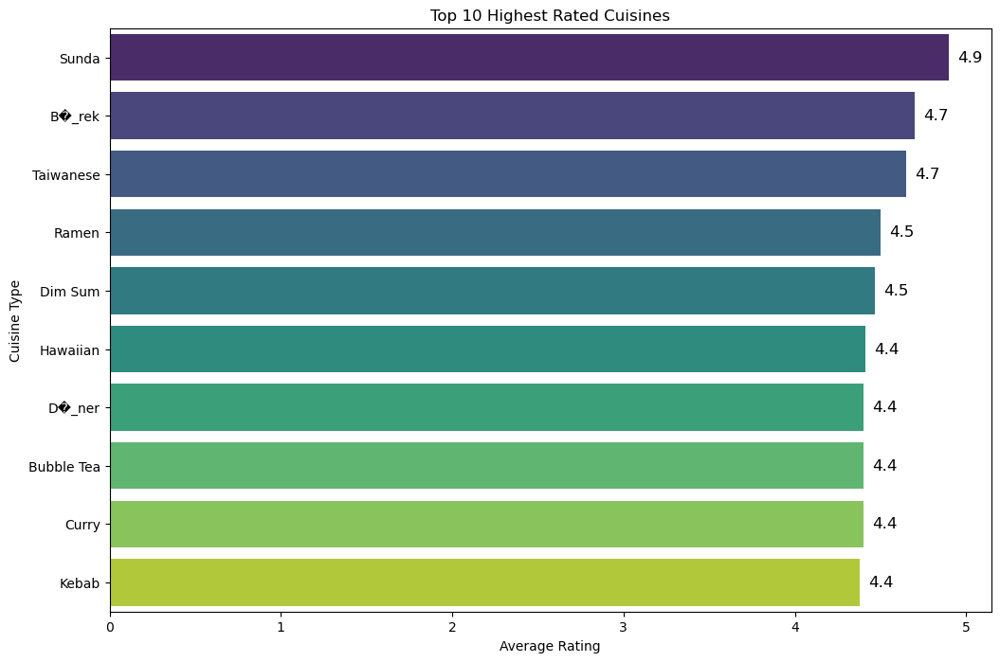

In [138]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(y=top_rated_cuisines['Cuisines'], x=top_rated_cuisines['Aggregate rating'], palette='viridis')
for p in ax.patches:
    ax.annotate(
        f'{p.get_width():.1f}',
        (p.get_width() + 0.05, p.get_y() + p.get_height() / 2),  
        ha='left', va='center', 
        fontsize=12, color='black'
    )
plt.xlabel("Average Rating")
plt.ylabel("Cuisine Type")
plt.title("Top 10 Highest Rated Cuisines")
plt.show()

1. **Top 10 Highest Rated Cuisines**
   - The highest-rated cuisine is **`Sunda (4.9 avg rating)`**.
   - Other top-rated cuisines include `Börek`, `Taiwanese`, `Ramen`, and `Dim Sum`.
   - These cuisines tend to have fewer votes, suggesting they are niche but highly appreciated because :
     - Niche cuisines (like Taiwanese, Dim Sum, and Sunda) tend to have fewer restaurants, but those who try them love them.
     - These cuisines may not be widely available, leading to fewer votes but high satisfaction among those who try them.

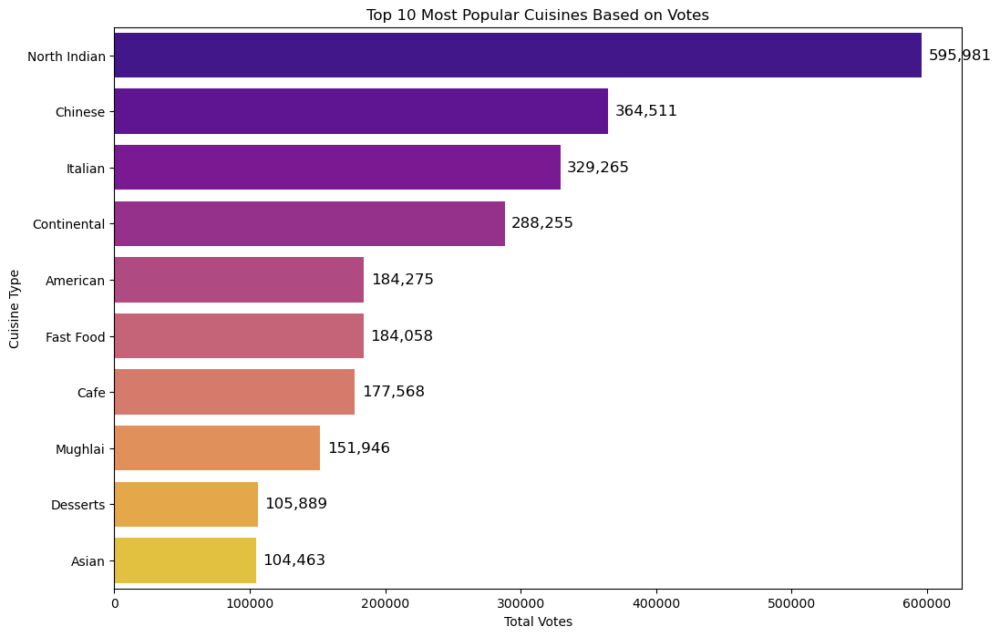

In [139]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(y=top_voted_cuisines['Cuisines'], x=top_voted_cuisines['Votes'], palette='plasma')

# Adding annotations
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_width()):,}', 
        (p.get_x() + p.get_width() + 5000, p.get_y() + p.get_height() / 2),  
        ha='left', va='center',
        fontsize=12, color='black'
    )

plt.xlabel("Total Votes")
plt.ylabel("Cuisine Type")
plt.title("Top 10 Most Popular Cuisines Based on Votes")
plt.show()

2. **Top 10 Most Popular Cuisines (Based on Votes)**
   - **`North Indian`** cuisine had the highest number of votes `(~596K votes)`, even though its average rating was only `2.51`.
   - `Chinese`, `Italian`, and `Fast Food` cuisines also had very high votes but lower ratings.
   - `Asian` and `American` cuisines balanced both high votes and good ratings (`~3.8` and `3.66`, respectively).
      - **Why does this happen?**
        - `North Indian`, `Chinese`, and `Fast Food` are widely available and commonly eaten in many countries.
        - They have a large number of restaurants, leading to higher total votes.
        - However, since more people try these cuisines, opinions vary, resulting in a mix of positive and negative ratings.

### Cuisine Ratings vs. Popularity

| **Cuisine**      | **Avg. Rating** | **Total Votes** | **Key Takeaway** |
|-----------------|--------------|-------------|------------------------------|
| **Sunda**       | 4.9          | 5514        | Very niche, highly rated |
| **Börek**       | 4.7          | 1305        | Less common but loved |
| **Taiwanese**   | 4.6         | 384         | Very niche, highly rated |
| **Ramen**       | 4.5          | 1259        | Well-loved but not as popular |
| **North Indian**| 2.5         | 595981      | Highly popular, mixed reviews |
| **Chinese**     | 2.6         | 364351      | Widely available, mixed reviews |
| **Italian**     | 3.5         | 329265      | Balances popularity and good ratings |
| **Asian**       | 3.8         | 104303      | Popular and well-rated |
| **American**    | 3.6         | 183117      | Popular and decently rated |

---
1. **Popularity (Votes) Does Not Mean High Ratings**
   - `North Indian`, `Chinese`, and `Fast Food` have the highest votes but lower ratings.
   - This happens because these cuisines are very common, so they attract a wider audience with mixed reviews.
   - Some people love them, while others give lower ratings, bringing the average down.
2. **Highly Rated Cuisines Tend to Be Niche**
   - `Sunda`, `Taiwanese`, `Dim Sum`, and `Ramen` are all highly rated but have low total votes.
   - This means that not many people try them, but those who do, rate them very highly.
   - These cuisines might be available only in specific regions or fewer restaurants.
3. **Some Cuisines Balance Both Popularity and Good Ratings**
   - `Italian`, `American`, and `Asian` cuisines have both `high votes` and `decent ratings (~3.5–3.8)`.
   - This suggests that they are widely available and generally well-liked.
   - These cuisines could be considered "safe choices" for a good dining experience.
---
#### Final Thoughts
- If a restaurant wants `more customers`, it might serve popular cuisines (like `North Indian` or `Chinese`).
- If it wants `high ratings`, it might focus on niche, specialty cuisines (like `Taiwanese` or `Dim Sum`).
- If it wants both `popularity` and `good ratings`, it should offer cuisines like `Italian`, `American`, or `Asian`.

## TASK 3 :-

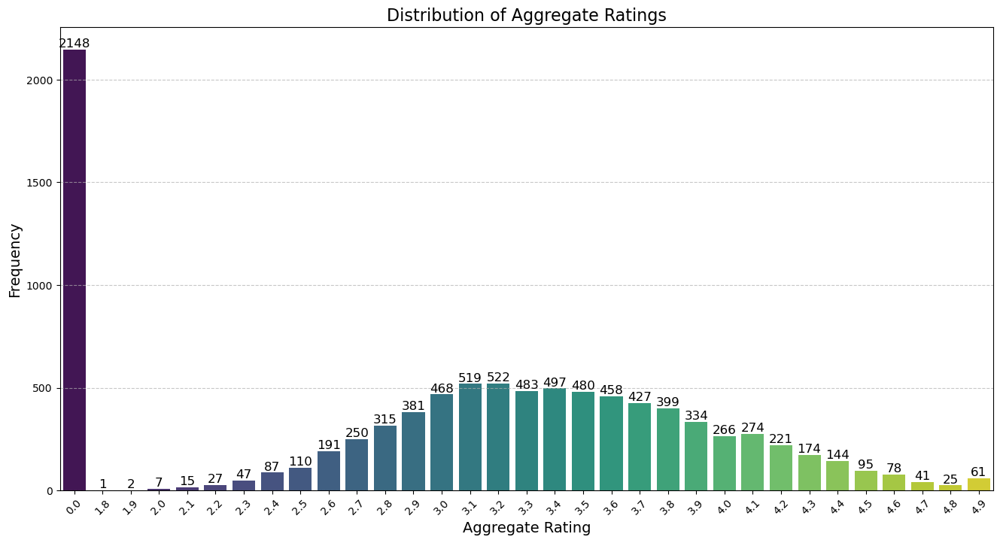

In [140]:
rating_distribution = df1['Aggregate rating'].value_counts().sort_index()
plt.figure(figsize=(16, 8))
ax = sns.barplot(
    x=rating_distribution.index,
    y=rating_distribution.values,
    palette="viridis"
)
for p in ax.patches:
    count = int(p.get_height())  # Get the height of the bar (count)
    ax.annotate(
        f'{count}', 
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position annotation
        ha='center', va='bottom', 
        fontsize=12, color='black', rotation=0  # Keep text horizontal (rotation=0)
    )
plt.title("Distribution of Aggregate Ratings", fontsize=16)
plt.xlabel("Aggregate Rating", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

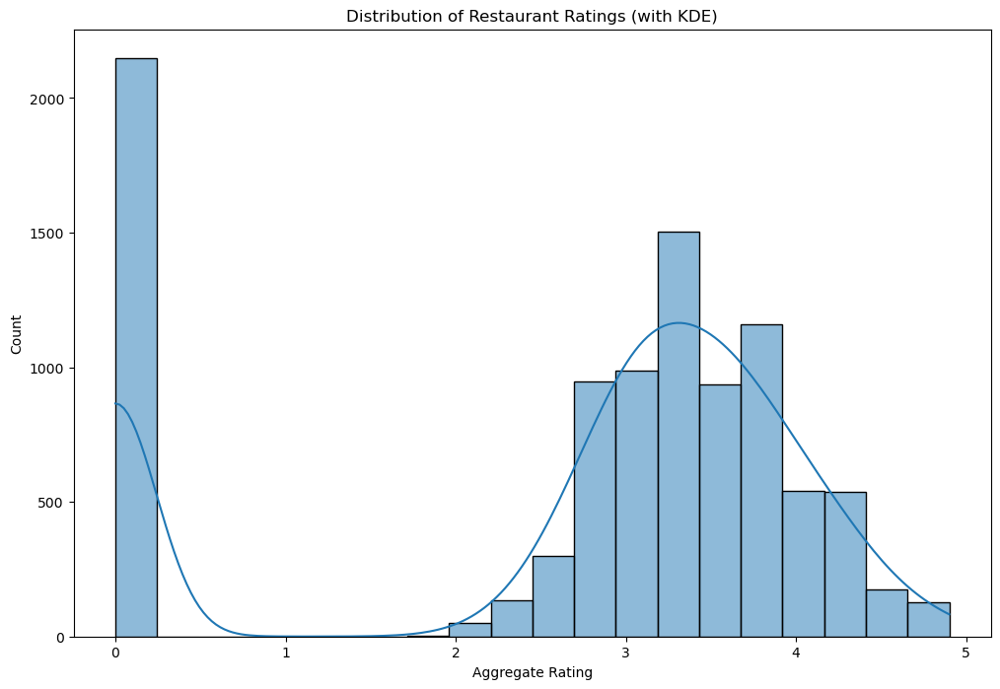

In [141]:
plt.figure(figsize=(12, 8))
sns.histplot(df1['Aggregate rating'].dropna(), bins=20, kde=True)

# Labels and Title
plt.xlabel("Aggregate Rating")
plt.ylabel("Count")
plt.title("Distribution of Restaurant Ratings (with KDE)")
plt.show()

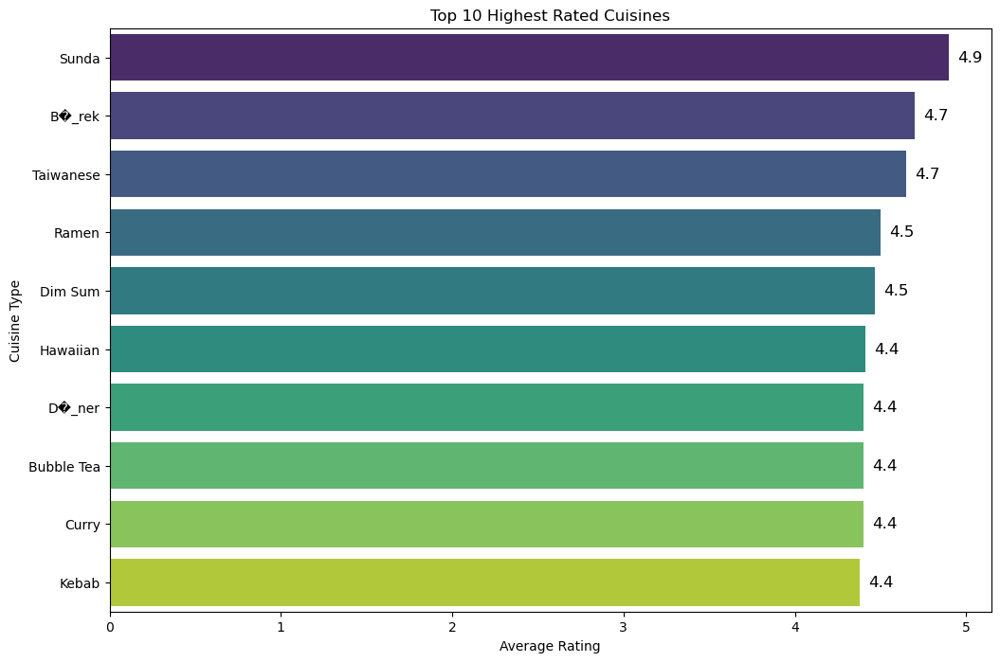

In [142]:
plt.figure(figsize=(12, 8))
ax = sns.barplot(y=top_rated_cuisines['Cuisines'], x=top_rated_cuisines['Aggregate rating'], palette='viridis')
for p in ax.patches:
    ax.annotate(
        f'{p.get_width():.1f}',
        (p.get_width() + 0.05, p.get_y() + p.get_height() / 2),  
        ha='left', va='center', 
        fontsize=12, color='black'
    )
plt.xlabel("Average Rating")
plt.ylabel("Cuisine Type")
plt.title("Top 10 Highest Rated Cuisines")
plt.show()

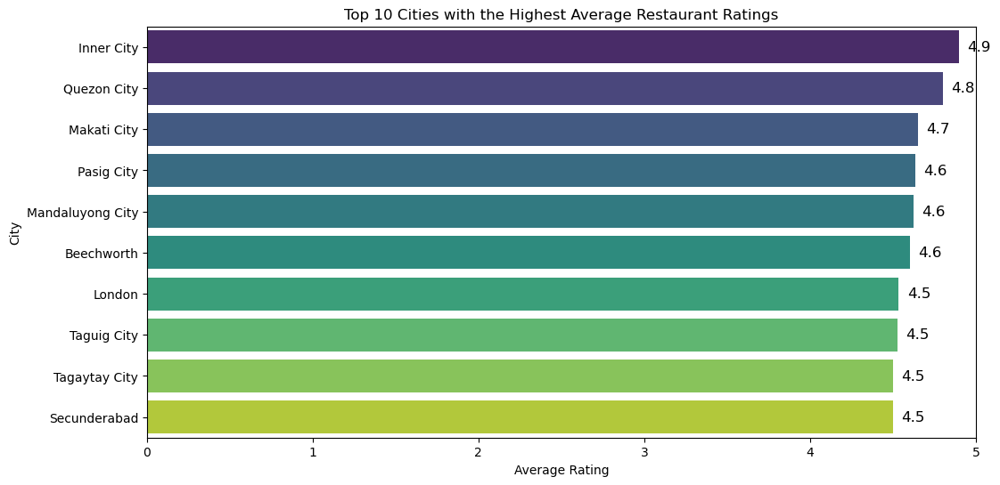

In [143]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x=df1.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False).head(10).values,
    y=df1.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False).head(10).index,
    palette="viridis"
)
for p in ax.patches:
    ax.annotate(
        f'{p.get_width():.1f}',
        (p.get_width() + 0.05, p.get_y() + p.get_height() / 2),  
        ha='left', va='center', 
        fontsize=12, color='black'
    )
plt.xlabel("Average Rating")
plt.ylabel("City")
plt.title("Top 10 Cities with the Highest Average Restaurant Ratings")
plt.xlim(0, 5)
plt.show()

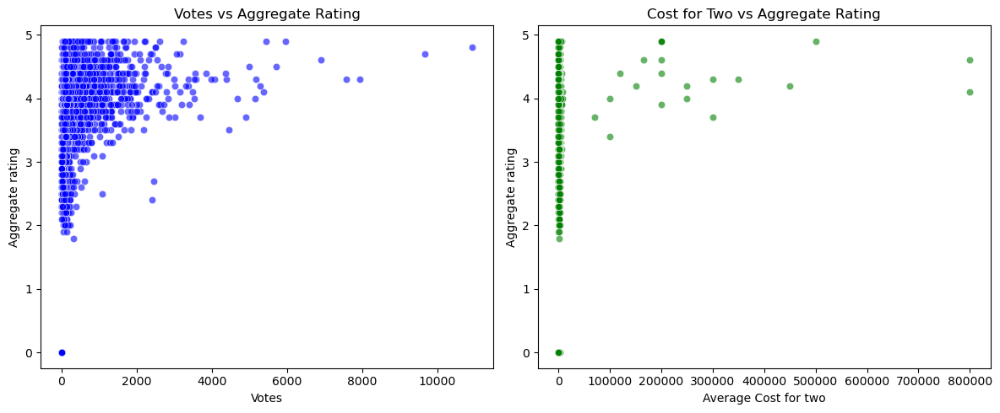

In [144]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.scatterplot(x=df1['Votes'], y=df1['Aggregate rating'], ax=axes[0], color='blue', alpha=0.6)
axes[0].set_title("Votes vs Aggregate Rating")
sns.scatterplot(x=df1['Average Cost for two'], y=df1['Aggregate rating'], ax=axes[1], color='green', alpha=0.6)
axes[1].set_title("Cost for Two vs Aggregate Rating")
plt.tight_layout()
plt.show()

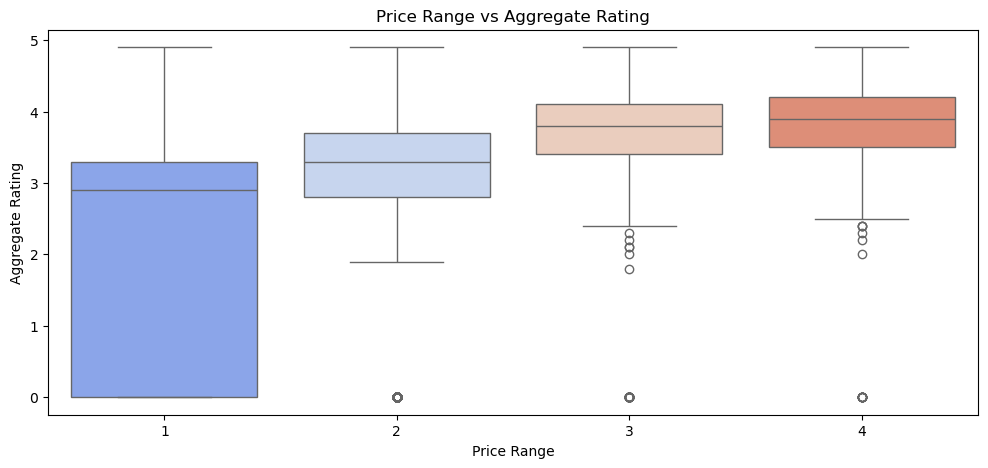

In [145]:
plt.figure(figsize=(12, 5))
sns.boxplot(x=df1['Price range'], y=df1['Aggregate rating'], palette='coolwarm')
plt.xlabel("Price Range")
plt.ylabel("Aggregate Rating")
plt.title("Price Range vs Aggregate Rating")
plt.show()

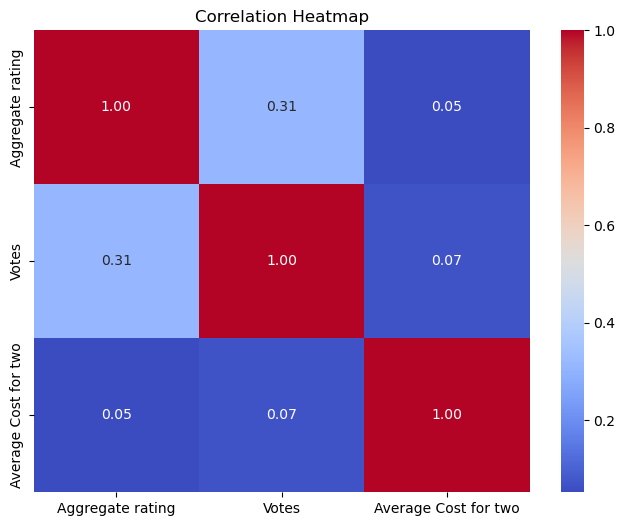

In [146]:
plt.figure(figsize=(8, 6))
sns.heatmap(df1[['Aggregate rating', 'Votes', 'Average Cost for two']].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.show()